In [1]:
import config, parse_midas_data, sample_utils as su, temporal_changes_utils, stats_utils, midas_db_utils, parse_patric, plot_utils
from collections import defaultdict
import numpy as np
from numpy.random import binomial as sample_binomial
import math, pickle, sys, random
from math import log10,ceil,log,exp

import scipy.stats
import matplotlib.colorbar as colorbar
import matplotlib.colors as mplcol
import matplotlib.pyplot as plt
import matplotlib.cm as cmx
from matplotlib.patches import Patch
from matplotlib import rcParams
from matplotlib import gridspec
rcParams['font.family'] = 'sans-serif'
rcParams['font.sans-serif'] = ['Arial']

In [ ]:
# Plot directory
plot_dir = "%s/" % (config.analysis_directory)

# Species list
good_species_list = parse_midas_data.load_pickled_good_species_list()

# Sample-subject-order-cohort maps
sys.stderr.write("Loading sample metadata...\n")
subject_sample_map = su.parse_subject_sample_map()
sample_order_map = su.parse_sample_order_map()
sample_subject_map = su.parse_sample_subject_map()
sample_cohort_map = su.parse_sample_cohort_map()
same_mi_pair_dict = su.get_same_mi_pair_dict(subject_sample_map)
sys.stderr.write("Done!\n")

# Cohorts
cohorts = ['backhed', 'ferretti', 'yassour', 'shao', 'hmp']
mi_cohorts = ['backhed', 'ferretti', 'yassour', 'shao']

# Samples for each cohort
samples = {cohort: su.get_sample_names(cohort) for cohort in cohorts}
hmp_samples = su.get_sample_names('hmp')
mother_samples = su.get_sample_names('mother')
infant_samples = su.get_sample_names('infant')
olm_samples = su.get_sample_names('olm')
infant_samples = [sample for sample in infant_samples if sample not in olm_samples] # Exclude Olm
mother_samples = [sample for sample in mother_samples if sample not in olm_samples] # Exclude Olm
mi_samples = [sample for sample in (mother_samples + infant_samples) if sample not in olm_samples] # Exclude Olm

# Sample identity wrapper functions
is_infant = lambda sample: sample in infant_samples
is_mother = lambda sample: sample in mother_samples
is_adult = lambda sample: sample in hmp_samples

# Sample-timepoint map
mi_sample_day_dict = su.get_mi_sample_day_dict(exclude_cohorts=['olm'])
mi_tp_sample_dict = su.get_mi_tp_sample_dict(exclude_cohorts=['olm']) # no binning
mi_tp_sample_dict_binned, mi_tp_binned_labels = su.get_mi_tp_sample_dict(exclude_cohorts=['olm'], binned=True)

Loading sample metadata...
Done!


In [ ]:
# Significance tests
# function to calculate Cohen's d for independent samples
def cohenD(d1, d2):
    n1, n2 = len(d1), len(d2)
    s1, s2 = np.var(d1, ddof=1), np.var(d2, ddof=1)
    s = np.sqrt(((n1 - 1) * s1 + (n2 - 1) * s2) / (n1 + n2 - 2))
    u1, u2 = np.mean(d1), np.mean(d2)
    return (u1 - u2) / s

In [ ]:
# ======================================================================
# Load pickled data
# ======================================================================

# Parameters
sweep_type = 'full' # assume full for now
pp_prev_cohort = 'all'
min_coverage = 0

ddir = config.data_directory
pdir = "%s/pickles/cov%i_prev_%s/nonconsecutive" % (ddir, min_coverage, pp_prev_cohort)

In [ ]:
snp_changes = pickle.load(open('%s/big_snp_changes_%s.pkl' % (pdir, sweep_type), 'rb'))
gene_changes = pickle.load(open('%s/big_gene_changes_%s.pkl' % (pdir, sweep_type), 'rb'))
snp_change_freqs = pickle.load(open('%s/snp_change_freqs_%s.pkl' % (pdir, sweep_type), 'rb'))
snp_change_freqs_with_opps = pickle.load(open('%s/snp_change_freqs_with_opps_full.pkl' % (pdir), 'rb'))
snp_change_null_freqs = pickle.load(open('%s/snp_change_null_freqs_%s.pkl' % (pdir, sweep_type), 'rb'))
print("Checkpoint 1")
gene_gain_freqs = pickle.load(open('%s/gene_gain_freqs_%s.pkl' % (pdir, sweep_type), 'rb'))
gene_loss_freqs = pickle.load(open('%s/gene_loss_freqs_%s.pkl' % (pdir, sweep_type), 'rb'))
gene_loss_null_freqs = pickle.load(open('%s/gene_loss_null_freqs_%s.pkl' % (pdir, sweep_type), 'rb'))
between_snp_change_counts = pickle.load(open('%s/between_snp_change_counts_%s.pkl' % (pdir, sweep_type), 'rb'))
between_gene_change_counts = pickle.load(open('%s/between_gene_change_counts_%s.pkl' % (pdir, sweep_type), 'rb'))
print("Checkpoint 2")

Checkpoint 1
Checkpoint 2


In [ ]:
snp_change_present_gene_null = pickle.load(open('%s/snp_change_present_gene_null' % pdir, 'rb'))
snp_change_between_host_null = pickle.load(open('%s/snp_change_between_host_null' % pdir, 'rb'))
snp_change_pangenome_null = pickle.load(open('%s/snp_change_pangenome_null' % pdir, 'rb'))
print("Checkpoint 3")
dnds_info = pickle.load(open('%s/dnds_info.pkl' % (pdir), 'rb'))
print("Checkpoint 4")

Checkpoint 3
Checkpoint 4


In [ ]:
# Consecutive data

# Parameters
sweep_type = 'full' # assume full for now
pp_prev_cohort = 'all'
min_coverage = 0

ddir = config.data_directory
pdir = "%s/pickles/cov%i_prev_%s" % (ddir, min_coverage, pp_prev_cohort)

snp_changes_consecutive = pickle.load(open('%s/big_snp_changes_%s.pkl' % (pdir, sweep_type), 'rb'))
gene_changes_consecutive = pickle.load(open('%s/big_gene_changes_%s.pkl' % (pdir, sweep_type), 'rb'))
print("Checkpoint 5")

Checkpoint 5


In [ ]:
# seeding analysis pickles
pdir = "%s/pickles/seeding" % (ddir)
species_allele_counts_map = {}
for species in snp_changes.keys():
    fpath = "%s/allele_counts_map_%s.pkl" % (pdir, species)
    species_allele_counts_map[species] = pickle.load(open(fpath, 'rb'))
print("Checkpoint 6")

Checkpoint 6


In [11]:
# Custom sample pair cohorts [not just sample!]
# Alternate version where a sample pair may be assigned multiple cohorts

# custom_cohort_tests: dictionary where keys are cohort names and values are 
# boolean functions taking in sample_i, sample_j as arguments

def custom_cohorts_of_sample_pair(custom_cohort_tests, sample_i, sample_j, species='dummy'):
    my_cohorts = set()
    for cohort in custom_cohort_tests:
        if custom_cohort_tests[cohort](sample_i, sample_j, species):
            my_cohorts.add(cohort)
    return my_cohorts

In [12]:
# Establish custom cohorts to be used for all three rates plots

custom_cohort_tests = {}
custom_cohort_tests['Mother-Infant(wk1)']  = lambda s1, s2, sp: ((is_mother(s1) and is_infant(s2)) 
                                                        and mi_sample_day_dict[s1] >= 0 
                                                        and mi_sample_day_dict[s2] <= 7)

custom_cohort_tests['Mother-Infant(all)']  = lambda s1, s2, sp: ((is_mother(s1) and is_infant(s2)))

custom_cohort_tests['Day 0-Week 1']   = lambda s1, s2, sp: ((is_infant(s1) and is_infant(s2))
                                                        and mi_sample_day_dict[s1] >= 0
                                                        and mi_sample_day_dict[s2] <= 7)

custom_cohort_tests['Week 1-Month 1'] = lambda s1, s2, sp: ((is_infant(s1) and is_infant(s2)) 
                                                        and mi_sample_day_dict[s1] >= 7
                                                        and mi_sample_day_dict[s2] <= 31)

custom_cohort_tests['Month 1-Year 1'] = lambda s1, s2, sp: ((is_infant(s1) and is_infant(s2)) 
                                                        and mi_sample_day_dict[s1] >= 31 
                                                        and mi_sample_day_dict[s2] <= 367)

custom_cohort_tests['Adult-Adult']   = lambda s1, s2, sp: (is_adult(s1) and is_adult(s2))

custom_cohort_tests['Infant-Infant'] = lambda s1, s2, sp: (is_infant(s1) and is_infant(s2))

In [13]:
# species -> mother_sample -> infant_sample -> # days of infant_sample
# mother timepoint at delivery (-1 to 7 days)
mi_dict = {species: defaultdict(dict) for species in gene_gain_freqs}

for species in snp_changes:
    for sample_i, sample_j in snp_changes[species]:
        
        # MI: restrict to earliest mother-infant pair per host
        if 'Mother-Infant(all)' in custom_cohorts_of_sample_pair(custom_cohort_tests, sample_i, sample_j):
            mother_days = mi_sample_day_dict[sample_i]
            if mother_days >= -1 and mother_days <= 7:
                mi_dict[species][sample_i][sample_j] = mi_sample_day_dict[sample_j]

# species -> mother_sample -> earliest infant sample
mi_earliest_infant_sample_dict = defaultdict(dict)

# Distribution of which day the earliest infant tp occurs at
# Hopefully nothing too late
earliest_infant_days = []

for species in mi_dict:
    for mother_sample in mi_dict[species]:
        ordered_infant_days = sorted(mi_dict[species][mother_sample].items(), key=lambda x: x[1])
        infant_sample, days = ordered_infant_days[0]
        mi_earliest_infant_sample_dict[species][mother_sample] = infant_sample
        earliest_infant_days.append(days)

In [14]:
# Add one more category
custom_cohort_tests['Mother-Infant(earliest)']  = lambda s1, s2, sp: ((is_mother(s1) and is_infant(s2) 
                                                                       and (s1 in mi_earliest_infant_sample_dict[sp]) 
                                                                       and (s2 == mi_earliest_infant_sample_dict[sp][s1])))

In [15]:
def calculate_unnormalized_survival_from_vector(counts):
    counts = sorted(counts)
    xs = []
    ns = []
    ns_cur = len(counts)
    min_count = -1
    for count in counts:
        if count > min_count:
            ns.append(ns_cur) # Number of elements greater or equal
            xs.append(count)
            min_count = count
        ns_cur -= 1
    xs.append(xs[len(xs)-1]+1)
    ns.append(0)
    return xs, np.array(ns)

# SNP change parallelism

In [ ]:
# Parallelism (for SNP changes) at gene annotation and gene ID level

custom_cohorts_ordered = list(custom_cohort_tests.keys())
variant_types = ['4D', '1D', '2D', '3D']

# cohort -> gene ID -> variant type -> count of SNP changes
gene_IDs_by_cohort = {cohort: {} for cohort in custom_cohort_tests}
gene_IDs_by_cohort_present_null = {cohort: defaultdict(int) for cohort in custom_cohorts_ordered}
gene_IDs_by_cohort_between_null = {cohort: defaultdict(int) for cohort in custom_cohorts_ordered}
gene_IDs_by_cohort_pangenome_null = {cohort: defaultdict(int) for cohort in custom_cohorts_ordered}
# cohort -> gene ID -> count of unique hosts
num_host_gene_IDs_by_cohort = {cohort: defaultdict(set) for cohort in custom_cohort_tests}

# To get information about which name each gene ID corresponds to
gene_id_name_map = {}

# cohort -> gene -> variant type -> count of SNP changes
genes_by_cohort = {cohort: {} for cohort in custom_cohort_tests}
genes_by_cohort_present_null = {cohort: defaultdict(int) for cohort in custom_cohorts_ordered}
genes_by_cohort_between_null = {cohort: defaultdict(int) for cohort in custom_cohorts_ordered}
genes_by_cohort_pangenome_null = {cohort: defaultdict(int) for cohort in custom_cohorts_ordered}
# cohort -> gene -> count of unique hosts
num_host_genes_by_cohort = {cohort: defaultdict(set) for cohort in custom_cohort_tests}

for species in snp_changes_consecutive:
    
    print("Working on %s...." % species)
    genome_ids = midas_db_utils.get_ref_genome_ids(species)
    # load the gene descriptions for all genomes coresponding to this speceis:
    gene_descriptions=parse_patric.load_patric_gene_descriptions(genome_ids)
    
    for sample_i, sample_j in snp_changes[species]:
        
        val = snp_changes[species][(sample_i, sample_j)]
        subject_tuple = (sample_subject_map[sample_i], sample_subject_map[sample_j])
        custom_cohorts = custom_cohorts_of_sample_pair(custom_cohort_tests, sample_i, sample_j, species)
        
        if type(val) == type([]):
            for custom_cohort in custom_cohorts:
                
                # Store actual changed genes
                for gene_id, contig, position, variant_type, A1, D1, A2, D2 in val:
                    
                    if gene_id not in gene_IDs_by_cohort[custom_cohort]:
                        gene_IDs_by_cohort[custom_cohort][gene_id] = {vartype: 0 for vartype in variant_types}
                    gene_IDs_by_cohort[custom_cohort][gene_id][variant_type] += 1
                    num_host_gene_IDs_by_cohort[custom_cohort][gene_id].add(subject_tuple)
                    
                    try:
                        desc = gene_descriptions[gene_id]
                        gene_id_name_map[gene_id] = desc
                        if desc not in genes_by_cohort[custom_cohort]:
                            genes_by_cohort[custom_cohort][desc] = {vartype: 0 for vartype in variant_types}
                        genes_by_cohort[custom_cohort][desc][variant_type] += 1
                        num_host_genes_by_cohort[custom_cohort][desc].add(subject_tuple)
                    except:
                        print("Weird")
                        continue

                # Store present gene null
                for gene_id in snp_change_present_gene_null[species][(sample_i, sample_j)]:
                    
                    count = snp_change_present_gene_null[species][(sample_i, sample_j)][gene_id]
                    
                    gene_IDs_by_cohort_present_null[custom_cohort][gene_id] += count          
                    
                    try:
                        desc = gene_descriptions[gene_id]
                        genes_by_cohort_present_null[custom_cohort][desc] += count
                    except:
                        print("Weird - present")
                        continue

                # Store between host null
                for gene_id in snp_change_between_host_null[species][(sample_i, sample_j)]:
                    
                    count = snp_change_between_host_null[species][(sample_i, sample_j)][gene_id]
                    
                    gene_IDs_by_cohort_between_null[custom_cohort][gene_id] += count
                    
                    try:
                        desc = gene_descriptions[gene_id]
                        genes_by_cohort_between_null[custom_cohort][desc] += count
                    except:
                        print("Weird - between")
                        continue

                # Store pangenome null
                for gene_id in snp_change_pangenome_null[species][(sample_i, sample_j)]:
                    
                    count = snp_change_pangenome_null[species][(sample_i, sample_j)][gene_id]
                    
                    gene_IDs_by_cohort_pangenome_null[custom_cohort][gene_id] += count
                    
                    try:
                        desc = gene_descriptions[gene_id]                        
                        genes_by_cohort_pangenome_null[custom_cohort][desc] += count
                    except:
                        print("Weird - pangenome")
                        continue

Working on Lactobacillus_paracasei_55666....
Working on Leclercia_adecarboxylata_62497....
Working on Bacteroides_sartorii_54642....
Working on Megamonas_hypermegale_57114....
Working on Bacteroides_intestinalis_61596....
Weird - present
Working on Bacteroides_uniformis_57318....
Weird - present
Weird - pangenome
Weird - present
Weird - present
Weird - present
Weird - present
Working on Bifidobacterium_bifidum_55065....
Working on Clostridium_bolteae_57158....
Working on Clostridium_paraputrificum_59909....
Working on Subdoligranulum_sp_62068....
Working on Enterococcus_faecium_56710....
Working on Streptococcus_lutetiensis_58501....
Working on Phascolarctobacterium_succinatutens_61948....
Working on Faecalibacterium_prausnitzii_62201....
Working on Faecalibacterium_prausnitzii_61481....
Working on Streptococcus_anginosus_58223....
Working on Blautia_wexlerae_56130....
Working on Dorea_longicatena_61473....
Working on Staphylococcus_warneri_58053....
Working on Streptococcus_salivarius

Working on Enterobacter_aerogenes_55704....
Working on Bacteroides_massiliensis_44749....
Working on Streptococcus_salivarius_58022....
Working on Sutterella_wadsworthensis_56828....
Working on Streptococcus_sp_60086....
Working on Escherichia_hermannii_58626....
Working on Bifidobacterium_catenulatum_58257....
Working on Rothia_mucilaginosa_62109....
Working on Varibaculum_cambriense_60384....
Working on Bacteroides_finegoldii_57739....
Working on Parabacteroides_merdae_56972....
Weird - pangenome
Working on Bradyrhizobium_sp_61126....
Working on Enterobacter_cloacae_55612....
Working on Streptococcus_parasanguinis_62442....
Working on Bacteroides_coprophilus_61767....
Working on Enterococcus_durans_52177....
Working on Veillonella_sp_62611....
Working on Pantoea_sp_60700....
Working on Citrobacter_braakii_56022....
Working on Eubacterium_ventriosum_61474....
Working on Finegoldia_magna_61710....
Working on Coprobacter_fastidiosus_56550....
Working on Streptococcus_parasanguinis_58126

In [26]:
same_subject_idxs = su.calculate_mi_ordered_same_subject_pairs(sample_order_map, all_samples, 
                                                               within_host_type='consecutive', one_per_mi_pair=False)

NameError: name 'all_samples' is not defined

In [27]:
len(same_subject_idxs[0])

NameError: name 'same_subject_idxs' is not defined

In [31]:
# Report context to get a sense of how big the parallel mutation counts are

custom_cohorts_ordered = ['Mother-Infant(all)', 'Mother-Infant(wk1)', 'Day 0-Week 1', 'Week 1-Month 1', 'Month 1-Year 1', 'Infant-Infant', 'Adult-Adult']

num_mod_snp_changes = defaultdict(int)
num_modifications = defaultdict(int)
num_qp_pairs = defaultdict(int)
qp_pair_unique_hosts = defaultdict(set)

for species in snp_changes_consecutive:
    for sample_i, sample_j in snp_changes[species]:
        val = snp_changes[species][(sample_i, sample_j)]
        subject_tuple = (sample_subject_map[sample_i], sample_subject_map[sample_j])
        custom_cohorts = custom_cohorts_of_sample_pair(custom_cohort_tests, sample_i, sample_j)
        
        for custom_cohort in custom_cohorts:
            num_qp_pairs[custom_cohort] += 1
            qp_pair_unique_hosts[custom_cohort].add(subject_tuple)

        if type(val) == type([]):
            for custom_cohort in custom_cohorts:
                num_snp_changes = len(val)
                num_mod_snp_changes[custom_cohort] += num_snp_changes
                if num_snp_changes > 0:
                    num_modifications[custom_cohort] += 1

all_samples = hmp_samples + mother_samples + infant_samples
# same_subject_idxs = su.calculate_mi_ordered_same_subject_pairs(sample_order_map, all_samples, 
#                                                                within_host_type='consecutive', one_per_mi_pair=False)

num_cons_pairs = defaultdict(int)
cons_pair_unique_hosts = defaultdict(set)

for i, j in zip(same_subject_idxs[0], same_subject_idxs[1]):
    sample_i = all_samples[i]
    sample_j = all_samples[j]
    subject_tuple = (sample_subject_map[sample_i], sample_subject_map[sample_j])
    custom_cohorts = custom_cohorts_of_sample_pair(custom_cohort_tests, sample_i, sample_j)
    
    for custom_cohort in custom_cohorts:
        num_cons_pairs[custom_cohort] += 1
        cons_pair_unique_hosts[custom_cohort].add(subject_tuple)

print("Total number of consecutive temporal sample pairs across mothers, infants and adults: %i" % len(same_subject_idxs[0]))

for custom_cohort in custom_cohorts_ordered:
    print('====================================================================')
    print(custom_cohort)
    print('====================================================================')
    print("Number of consecutive temporal sample pairs (regardless of QP): %i" % num_cons_pairs[custom_cohort])
    print("Number of unique hosts of consecutive temporal sample pairs: %i" % len(cons_pair_unique_hosts[custom_cohort]))
    print("Number of consecutive QP sample-species pairs: %i" % num_qp_pairs[custom_cohort])
    print("Number of unique hosts of consecutive QP sample-species pairs: %i" % len(qp_pair_unique_hosts[custom_cohort]))
    print("Number of QP sample-species pairs which are modifications: %i" % num_modifications[custom_cohort])
    print("Number of modification SNP changes considered: %i" % num_mod_snp_changes[custom_cohort])
    print("")

Total number of consecutive temporal sample pairs across mothers, infants and adults: 2846
Mother-Infant(all)
Number of consecutive temporal sample pairs (regardless of QP): 1172
Number of unique hosts of consecutive temporal sample pairs: 311
Number of consecutive QP sample-species pairs: 255
Number of unique hosts of consecutive QP sample-species pairs: 98
Number of QP sample-species pairs which are modifications: 94
Number of modification SNP changes considered: 296

Mother-Infant(wk1)
Number of consecutive temporal sample pairs (regardless of QP): 412
Number of unique hosts of consecutive temporal sample pairs: 305
Number of consecutive QP sample-species pairs: 64
Number of unique hosts of consecutive QP sample-species pairs: 47
Number of QP sample-species pairs which are modifications: 9
Number of modification SNP changes considered: 32

Day 0-Week 1
Number of consecutive temporal sample pairs (regardless of QP): 317
Number of unique hosts of consecutive temporal sample pairs: 298

In [19]:
# Pickle everything

gene_parallelism_data = [gene_IDs_by_cohort, gene_IDs_by_cohort_present_null, gene_IDs_by_cohort_between_null, 
                         gene_IDs_by_cohort_pangenome_null, num_host_gene_IDs_by_cohort, genes_by_cohort,
                         genes_by_cohort_present_null, genes_by_cohort_between_null,
                         genes_by_cohort_pangenome_null, num_host_genes_by_cohort, gene_id_name_map]

pickle.dump(gene_parallelism_data, open('%s/gene_parallelism_data_v2.pkl' % pdir, 'wb'))

In [10]:
gene_parallelism_data = pickle.load(open('%s/gene_parallelism_data.pkl' % pdir, 'rb'))

gene_IDs_by_cohort, gene_IDs_by_cohort_present_null, gene_IDs_by_cohort_between_null, \
gene_IDs_by_cohort_pangenome_null, num_host_gene_IDs_by_cohort, genes_by_cohort, \
genes_by_cohort_present_null, genes_by_cohort_between_null, \
genes_by_cohort_pangenome_null, num_host_genes_by_cohort, gene_id_name_map = gene_parallelism_data

In [19]:
# Statistics for paper
# Outer membrane TonB-dependent transporter, utilization system for glycans and polysaccharides (PUL), SusC family
# How many times mutated, and in how many hosts, across infant-infant/mother-infant/adult-adult?

gene = 'Outer membrane TonB-dependent transporter, utilization system for glycans and polysaccharides (PUL), SusC family'
all_cohorts = ['Mother-Infant(earliest)', 'Infant-Infant', 'Adult-Adult']

count = 0
hosts = set()

for cohort in all_cohorts:
    count += sum(genes_by_cohort[cohort][gene].values())
    for host in num_host_genes_by_cohort[cohort][gene]:
        hosts.add(host)    

print("%i SNV changes" % count)
print("%i unique hosts" % len(hosts))

32 SNV changes
26 unique hosts


In [27]:
# Store SNP change annotation info in tabular form

custom_cohorts_ordered = ['Mother-Infant(all)', 'Mother-Infant(wk1)', 'Mother-Infant(earliest)', 'Day 0-Week 1', 'Week 1-Month 1', 'Month 1-Year 1', 'Infant-Infant', 'Adult-Adult']

f = open('%s/snp_change_gene_parallelism.tsv' % (config.analysis_directory), 'w')
f.write('\t'.join(['tp_type', 'num_unique_hosts', 'num_change', 'num_1d', 'num_2d', 'num_3d', 'num_4d', 'gene_id']) + '\n')

for cat in custom_cohorts_ordered:
    for gene, count_dict in sorted(genes_by_cohort[cat].items(), key=lambda x: x[1], reverse=True):

        count_1d = count_dict['1D']
        count_2d = count_dict['2D']
        count_3d = count_dict['3D']
        count_4d = count_dict['4D']
        num_unique_hosts = len(num_host_genes_by_cohort[cat][gene])
        total_count = count_1d + count_2d + count_3d + count_4d

        f.write('\t'.join([str(x) for x in [cat, num_unique_hosts, 
                                            total_count, count_1d, count_2d, count_3d, count_4d, 
                                            gene]]) + '\n')
f.close()

f = open('%s/snp_change_gene_ID_parallelism.tsv' % (config.analysis_directory), 'w')
f.write('\t'.join(['tp_type', 'num_unique_hosts', 'num_change', 'num_1d', 'num_2d', 'num_3d', 'num_4d', 'gene_id']) + '\n')

for cat in custom_cohorts_ordered:
    for gene, count_dict in sorted(gene_IDs_by_cohort[cat].items(), key=lambda x: x[1], reverse=True):

        count_1d = count_dict['1D']
        count_2d = count_dict['2D']
        count_3d = count_dict['3D']
        count_4d = count_dict['4D']
        num_unique_hosts = len(num_host_gene_IDs_by_cohort[cat][gene])
        total_count = count_1d + count_2d + count_3d + count_4d

        f.write('\t'.join([str(x) for x in [cat, num_unique_hosts, 
                                            total_count, count_1d, count_2d, count_3d, count_4d, 
                                            gene]]) + '\n')
f.close()

In [28]:
# Store SNP change annotation info in tabular form, extended

custom_cohorts_ordered = ['Mother-Infant(all)', 'Mother-Infant(wk1)', 'Mother-Infant(earliest)', 'Day 0-Week 1', 'Week 1-Month 1', 'Month 1-Year 1', 'Infant-Infant', 'Adult-Adult']

f = open('%s/snp_change_gene_parallelism_extended.tsv' % (config.analysis_directory), 'w')
f.write('\t'.join(['tp_type', 'num_unique_hosts', 'num_change', 'pres_null', 'btwn_null', 'pang_null', 'num_1d', 'num_2d', 'num_3d', 'num_4d', 'gene_id', 'gene_name']) + '\n')

for cat in custom_cohorts_ordered:
    for gene_id, count_dict in sorted(gene_IDs_by_cohort[cat].items(), key=lambda x: sum(x[1].values()), reverse=True):

        count_1d = count_dict['1D']
        count_2d = count_dict['2D']
        count_3d = count_dict['3D']
        count_4d = count_dict['4D']
        num_unique_hosts = len(num_host_gene_IDs_by_cohort[cat][gene_id])
        pres_null_count = gene_IDs_by_cohort_present_null[cat][gene_id]
        btwn_null_count = gene_IDs_by_cohort_between_null[cat][gene_id]
        pang_null_count = gene_IDs_by_cohort_pangenome_null[cat][gene_id]
        total_count = count_1d + count_2d + count_3d + count_4d
        gene_name = gene_id_name_map[gene_id]

        f.write('\t'.join([str(x) for x in [cat, num_unique_hosts, 
                                            total_count, pres_null_count, btwn_null_count, pang_null_count,
                                            count_1d, count_2d, count_3d, count_4d, 
                                            gene_id, gene_name]]) + '\n')
f.close()

In [38]:
# Store SNP change annotation in tabular form, final

custom_cohorts_ordered = ['Mother-Infant(earliest)', 'Infant-Infant', 'Adult-Adult']

f = open('%s/snp_change_gene_parallelism_v3.tsv' % (config.analysis_directory), 'w')
f.write('\t'.join(['MI_num_hosts','II_num_hosts','AA_num_hosts','total_unique_hosts',
                   'total_snp_changes','total_pres_null','total_pang_null',
                   'gene_name','gene_ids']) + '\n')

gene_name_total_hosts_dict = defaultdict(list)
gene_name_gene_ids_dict = defaultdict(set)

for cat in custom_cohorts_ordered:
    for gene_id, count_dict in sorted(gene_IDs_by_cohort[cat].items(), key=lambda x: sum(x[1].values()), reverse=True):
        hosts = num_host_gene_IDs_by_cohort[cat][gene_id]
        gene_name = gene_id_name_map[gene_id]
        gene_name_total_hosts_dict[gene_name] += hosts
        gene_name_gene_ids_dict[gene_name].add(gene_id)

gene_name_total_hosts_count_dict = {}
for gene_name in gene_name_total_hosts_dict:
    gene_name_total_hosts_dict[gene_name] = len(set(gene_name_total_hosts_dict[gene_name]))

for gene_name, total_hosts in sorted(gene_name_total_hosts_dict.items(), key=lambda x: x[1], reverse=True):
    
    gene_ids = gene_name_gene_ids_dict[gene_name]
    
    mi_hosts = []; ii_hosts = []; aa_hosts = []
    
    for gene_id in gene_ids:
        mi_hosts += num_host_gene_IDs_by_cohort['Mother-Infant(earliest)'][gene_id]
        ii_hosts += num_host_gene_IDs_by_cohort['Infant-Infant'][gene_id]
        aa_hosts += num_host_gene_IDs_by_cohort['Adult-Adult'][gene_id]
        
        pres_null_count = gene_IDs_by_cohort_present_null[cat][gene_id]
        pang_null_count = gene_IDs_by_cohort_pangenome_null[cat][gene_id]
    
    num_snp_changes = 0; pres_null_count = 0; pang_null_count = 0
    
    for cat in custom_cohorts_ordered:
        for gene_id in gene_ids:
            if gene_id in gene_IDs_by_cohort[cat]:
                num_snp_changes += sum(gene_IDs_by_cohort[cat][gene_id].values())
            pres_null_count += gene_IDs_by_cohort_present_null[cat][gene_id]
            pang_null_count += gene_IDs_by_cohort_pangenome_null[cat][gene_id]

    f.write('\t'.join([str(x) for x in [len(set(mi_hosts)), len(set(ii_hosts)), len(set(aa_hosts)),
                                       total_hosts, num_snp_changes, pres_null_count, pang_null_count,
                                       gene_name, ','.join(list(gene_ids))]]) + '\n')
f.close()

In [21]:
# Wait, are my nulls ok?

custom_cohorts_ordered = ['Mother-Infant(earliest)', 'Infant-Infant', 'Adult-Adult']

num_snp_changes = 0; pres_null_count = 0; pang_null_count = 0
    
for cat in custom_cohorts_ordered:
    combined_genes = set(list(gene_IDs_by_cohort_pangenome_null[cat].keys()) + \
                         list(gene_IDs_by_cohort_present_null[cat].keys()) + \
                         list(gene_IDs_by_cohort[cat].keys()))
    for gene_id in combined_genes:
        if gene_id in gene_IDs_by_cohort[cat]:
            num_snp_changes += sum(gene_IDs_by_cohort[cat][gene_id].values())
        pres_null_count += gene_IDs_by_cohort_present_null[cat][gene_id]
        pang_null_count += gene_IDs_by_cohort_pangenome_null[cat][gene_id]

print(pres_null_count)
print(pang_null_count)
print(num_snp_changes)

1075.0
1075.0
1094


In [23]:
for cat in custom_cohorts_ordered:
    print(cat)
    print(len(gene_IDs_by_cohort_pangenome_null[cat].keys()))
    print(len(gene_IDs_by_cohort_present_null[cat].keys()))
    print(len(gene_IDs_by_cohort[cat].keys()))

Mother-Infant(earliest)
26164
26164
141
Infant-Infant
65340
65340
382
Adult-Adult
48920
48920
242


In [58]:
# Parallelism (for SNP changes), assuming gene_id_name_map already done
# Also make a new host-based null

custom_cohorts_ordered = list(custom_cohort_tests.keys())
variant_types = ['4D', '1D', '2D', '3D']

# cohort -> gene ID -> variant type -> count of SNP changes
gene_IDs_by_cohort = {cohort: {} for cohort in custom_cohort_tests}
gene_IDs_by_cohort_present_null = {cohort: defaultdict(int) for cohort in custom_cohorts_ordered}
gene_IDs_by_cohort_between_null = {cohort: defaultdict(int) for cohort in custom_cohorts_ordered}
gene_IDs_by_cohort_pangenome_null = {cohort: defaultdict(int) for cohort in custom_cohorts_ordered}
# cohort -> gene ID -> count of unique hosts
num_host_gene_IDs_by_cohort = {cohort: defaultdict(set) for cohort in custom_cohort_tests}

# cohort -> gene -> variant type -> count of SNP changes
genes_by_cohort = {cohort: {} for cohort in custom_cohort_tests}

# cohort -> gene -> count of SNP changes under null
genes_by_cohort_present_null = {cohort: defaultdict(int) for cohort in custom_cohorts_ordered}
genes_by_cohort_between_null = {cohort: defaultdict(int) for cohort in custom_cohorts_ordered}
genes_by_cohort_pangenome_null = {cohort: defaultdict(int) for cohort in custom_cohorts_ordered}

# cohort -> gene -> count of unique hosts
num_host_genes_by_cohort = {cohort: defaultdict(set) for cohort in custom_cohort_tests}

# cohort -> gene -> count of unique hosts under null
genes_hosts_by_cohort_present_null = {cohort: defaultdict(int) for cohort in custom_cohorts_ordered}
genes_hosts_by_cohort_between_null = {cohort: defaultdict(int) for cohort in custom_cohorts_ordered}
genes_hosts_by_cohort_pangenome_null = {cohort: defaultdict(int) for cohort in custom_cohorts_ordered}

for species in snp_changes_consecutive:  
    for sample_i, sample_j in snp_changes[species]:
        
        val = snp_changes[species][(sample_i, sample_j)]
        subject_tuple = (sample_subject_map[sample_i], sample_subject_map[sample_j])
        custom_cohorts = custom_cohorts_of_sample_pair(custom_cohort_tests, sample_i, sample_j, species)
        
        if type(val) == type([]):
            for custom_cohort in custom_cohorts:
                
                # Store actual changed genes
                for gene_id, contig, position, variant_type, A1, D1, A2, D2 in val:
                    
                    if gene_id not in gene_IDs_by_cohort[custom_cohort]:
                        gene_IDs_by_cohort[custom_cohort][gene_id] = {vartype: 0 for vartype in variant_types}
                    gene_IDs_by_cohort[custom_cohort][gene_id][variant_type] += 1
                    num_host_gene_IDs_by_cohort[custom_cohort][gene_id].add(subject_tuple)
                    
                    try:
                        desc = gene_id_name_map[gene_id]
                        gene_id_name_map[gene_id] = desc
                        if desc not in genes_by_cohort[custom_cohort]:
                            genes_by_cohort[custom_cohort][desc] = {vartype: 0 for vartype in variant_types}
                        genes_by_cohort[custom_cohort][desc][variant_type] += 1
                        num_host_genes_by_cohort[custom_cohort][desc].add(subject_tuple)
                    except:
                        print("Weird")
                        continue

                # Store present gene null
                for gene_id in snp_change_present_gene_null[species][(sample_i, sample_j)]:
                    
                    count = snp_change_present_gene_null[species][(sample_i, sample_j)][gene_id]
                    
                    if count != 0:
                        genes_hosts_by_cohort_between_null[]
                    gene_IDs_by_cohort_present_null[custom_cohort][gene_id] += count          
                    
                    try:
                        desc = gene_id_name_map[gene_id]
                        genes_by_cohort_present_null[custom_cohort][desc] += count
                    except:
                        print("Weird - present")
                        continue

                # Store between host null
                for gene_id in snp_change_between_host_null[species][(sample_i, sample_j)]:
                    
                    count = snp_change_between_host_null[species][(sample_i, sample_j)][gene_id]
                    
                    gene_IDs_by_cohort_between_null[custom_cohort][gene_id] += count
                    
                    try:
                        desc = gene_id_name_map[gene_id]
                        genes_by_cohort_between_null[custom_cohort][desc] += count
                    except:
                        print("Weird - between")
                        continue

                # Store pangenome null
                for gene_id in snp_change_pangenome_null[species][(sample_i, sample_j)]:
                    
                    count = snp_change_pangenome_null[species][(sample_i, sample_j)][gene_id]
                    
                    gene_IDs_by_cohort_pangenome_null[custom_cohort][gene_id] += count
                    
                    try:
                        desc = gene_id_name_map[gene_id]                       
                        genes_by_cohort_pangenome_null[custom_cohort][desc] += count
                    except:
                        print("Weird - pangenome")
                        continue

Weird - present
Weird - present
Weird - present
Weird - present
Weird - present
Weird - present
Weird - present
Weird - present
Weird - present
Weird - present
Weird - present
Weird - present
Weird - present
Weird - present
Weird - present
Weird - present
Weird - present
Weird - present
Weird - present
Weird - present
Weird - present
Weird - present
Weird - present
Weird - present
Weird - present
Weird - present
Weird - present
Weird - present
Weird - present
Weird - present
Weird - present
Weird - present
Weird - present
Weird - present
Weird - present
Weird - present
Weird - present
Weird - present
Weird - present
Weird - present
Weird - present
Weird - present
Weird - present
Weird - present
Weird - present
Weird - present
Weird - present
Weird - present
Weird - present
Weird - present
Weird - present
Weird - present
Weird - present
Weird - present
Weird - present
Weird - present
Weird - present
Weird - present
Weird - present
Weird - present
Weird - present
Weird - present
Weird - 

In [21]:
gene_IDs_by_cohort.keys()

['Mother-Infant(all)',
 'Day 0-Week 1',
 'Infant-Infant',
 'Week 1-Month 1',
 'Month 1-Year 1',
 'Adult-Adult',
 'Mother-Infant(wk1)',
 'Mother-Infant(earliest)']

# Gene change parallelism

In [57]:
# Parallelism (for gene changes)

variant_types = ['4D', '1D', '2D', '3D']

# cohort -> gene ID -> variant type -> count of gene gains/losses
gain_gene_IDs_by_cohort = {cohort: defaultdict(int) for cohort in custom_cohort_tests}
loss_gene_IDs_by_cohort = {cohort: defaultdict(int) for cohort in custom_cohort_tests}
# cohort -> gene ID -> count of unique hosts
gain_num_host_gene_IDs_by_cohort = {cohort: defaultdict(set) for cohort in custom_cohort_tests}
loss_num_host_gene_IDs_by_cohort = {cohort: defaultdict(set) for cohort in custom_cohort_tests}

# To get information about which name each gene ID corresponds to
gene_id_name_map = {}

# To get information about which species each gene ID corresponds to
gene_id_species_map = {}

# cohort -> gene -> variant type -> count of gene gains/losses
gain_genes_by_cohort = {cohort: defaultdict(int) for cohort in custom_cohort_tests}
loss_genes_by_cohort = {cohort: defaultdict(int) for cohort in custom_cohort_tests}
# cohort -> gene -> count of unique hosts
gain_num_host_genes_by_cohort = {cohort: defaultdict(set) for cohort in custom_cohort_tests}
loss_num_host_genes_by_cohort = {cohort: defaultdict(set) for cohort in custom_cohort_tests}

for species in gene_changes_consecutive:
    
    print("Working on %s...." % species)
    genome_ids = midas_db_utils.get_ref_genome_ids(species)
    
    # load the gene descriptions for all genomes coresponding to this speceis:
    gene_descriptions=parse_patric.load_patric_gene_descriptions(genome_ids)
    
    for sample_i, sample_j in gene_changes_consecutive[species]:
        
        gains, losses = gene_changes[species][(sample_i, sample_j)]
        subject_tuple = (sample_subject_map[sample_i], sample_subject_map[sample_j])
        custom_cohorts = custom_cohorts_of_sample_pair(custom_cohort_tests, sample_i, sample_j, species)
        
        # Also get dN/dS info
        nonsyn_diffs, nonsyn_opps, syn_diffs, syn_opps = dnds_info[species][(sample_i, sample_j)]
        
        if type(gains) == type([]): # Modification event
            
            for custom_cohort in custom_cohorts:
                # Gains
                for gene_id, D1, Dm1, D2, Dm2 in gains:

                    gain_gene_IDs_by_cohort[custom_cohort][gene_id] += 1
                    gain_num_host_gene_IDs_by_cohort[custom_cohort][gene_id].add(subject_tuple)

                    desc = gene_descriptions[gene_id]
                    gene_id_name_map[gene_id] = desc
                    gene_id_species_map[gene_id] = species
                    gain_genes_by_cohort[custom_cohort][desc] += 1
                    gain_num_host_genes_by_cohort[custom_cohort][desc].add(subject_tuple)

                # Losses
                for gene_id, D1, Dm1, D2, Dm2 in losses:
                    
                    loss_gene_IDs_by_cohort[custom_cohort][gene_id] += 1
                    loss_num_host_gene_IDs_by_cohort[custom_cohort][gene_id].add(subject_tuple)

                    desc = gene_descriptions[gene_id]
                    gene_id_name_map[gene_id] = desc
                    gene_id_species_map[gene_id] = species
                    loss_genes_by_cohort[custom_cohort][desc] += 1
                    loss_num_host_genes_by_cohort[custom_cohort][desc].add(subject_tuple)

Working on Lactobacillus_paracasei_55666....
Working on Leclercia_adecarboxylata_62497....
Working on Bacteroides_sartorii_54642....
Working on Megamonas_hypermegale_57114....
Working on Bacteroides_intestinalis_61596....
Working on Bacteroides_uniformis_57318....
Working on Bifidobacterium_bifidum_55065....
Working on Clostridium_bolteae_57158....
Working on Streptococcus_gallolyticus_57748....
Working on Clostridium_paraputrificum_59909....
Working on Subdoligranulum_sp_62068....
Working on Enterococcus_faecium_56710....
Working on Streptococcus_lutetiensis_58501....
Working on Phascolarctobacterium_succinatutens_61948....
Working on Faecalibacterium_prausnitzii_62201....
Working on Faecalibacterium_prausnitzii_61481....
Working on Streptococcus_anginosus_58223....
Working on Blautia_wexlerae_56130....
Working on Dorea_longicatena_61473....
Working on Staphylococcus_warneri_58053....
Working on Enterococcus_faecalis_55915....
Working on Streptococcus_salivarius_58037....
Working on A

In [59]:
# Pickle everything

gene_change_gene_parallelism_data = [gain_gene_IDs_by_cohort, loss_gene_IDs_by_cohort, gain_num_host_gene_IDs_by_cohort, 
                                     loss_num_host_gene_IDs_by_cohort, gene_id_name_map, gain_genes_by_cohort, 
                                     loss_genes_by_cohort, gain_num_host_genes_by_cohort, loss_num_host_genes_by_cohort,
                                    gene_id_species_map, gene_id_species_map]

pickle.dump(gene_change_gene_parallelism_data, open('%s/gene_change_gene_parallelism_data.pkl' % pdir, 'wb'))

In [60]:
gainloss_genes_by_cohort = {cohort: defaultdict(int) for cohort in custom_cohort_tests}

for cohort in custom_cohort_tests:
    combined_genes = set(gain_genes_by_cohort[cohort].keys() + loss_genes_by_cohort[cohort].keys())
    for gene in combined_genes:
        if gene not in gain_genes_by_cohort[cohort]:
            gain_genes_by_cohort[cohort][gene] = 0
        if gene not in loss_genes_by_cohort[cohort]:
            loss_genes_by_cohort[cohort][gene] = 0
        
        combined_gene_change_count = gain_genes_by_cohort[cohort][gene] + loss_genes_by_cohort[cohort][gene]
        
        gainloss_genes_by_cohort[cohort][gene] = combined_gene_change_count

In [61]:
gainloss_gene_IDs_by_cohort = {cohort: defaultdict(int) for cohort in custom_cohort_tests}

for cohort in custom_cohort_tests:
    combined_genes = set(gain_gene_IDs_by_cohort[cohort].keys() + loss_gene_IDs_by_cohort[cohort].keys())
    for gene in combined_genes:
        if gene not in gain_gene_IDs_by_cohort[cohort]:
            gain_gene_IDs_by_cohort[cohort][gene] = 0
        if gene not in loss_gene_IDs_by_cohort[cohort]:
            loss_gene_IDs_by_cohort[cohort][gene] = 0
        
        combined_gene_change_count = gain_gene_IDs_by_cohort[cohort][gene] + loss_gene_IDs_by_cohort[cohort][gene]
        
        gainloss_gene_IDs_by_cohort[cohort][gene] = combined_gene_change_count

In [39]:
# Sanity check: are we getting the same number of gene changes as in the prevalence plot?

total_gene_changes = 0
total_gains = 0
total_loss = 0

for custom_cohort in custom_cohort_tests:
    a = 0
    b = 0
    for gene in gainloss_genes_by_cohort[custom_cohort]:
        a += gainloss_genes_by_cohort[custom_cohort][gene]
    for gene_id in gainloss_gene_IDs_by_cohort[custom_cohort]:
        b += gainloss_gene_IDs_by_cohort[custom_cohort][gene_id]
    
    gains1 = 0
    gains2 = 0
    for gene in gain_genes_by_cohort[custom_cohort]:
        gains1 += gain_genes_by_cohort[custom_cohort][gene]
    for gene_id in gain_gene_IDs_by_cohort[custom_cohort]:
        gains2 += gain_gene_IDs_by_cohort[custom_cohort][gene_id]
    
    loss1 = 0
    loss2 = 0
    for gene in loss_genes_by_cohort[custom_cohort]:
        loss1 += loss_genes_by_cohort[custom_cohort][gene]
    for gene_id in loss_gene_IDs_by_cohort[custom_cohort]:
        loss2 += loss_gene_IDs_by_cohort[custom_cohort][gene_id]
    
    print(custom_cohort)
    print("Number of total gene changes: %i %i" % (a, b))
    print("Number of gains: %i %i" % (gains1, gains2))
    print("Number of losses: %i %i" % (loss1, loss2))
    print('')
    
    total_gene_changes += a
    total_gains += gains1
    total_loss += loss1

print("Total (duplicates included):")
print(total_gene_changes)
print(total_gains)
print(total_loss)
# 2500 gene changes, 1228 gains, 1272 losses

Mother-Infant(all)
Number of total gene changes: 141 141
Number of gains: 29 29
Number of losses: 112 112

Day 0-Week 1
Number of total gene changes: 160 160
Number of gains: 85 85
Number of losses: 75 75

Infant-Infant
Number of total gene changes: 1503 1503
Number of gains: 787 787
Number of losses: 716 716

Week 1-Month 1
Number of total gene changes: 358 358
Number of gains: 112 112
Number of losses: 246 246

Month 1-Year 1
Number of total gene changes: 123 123
Number of gains: 107 107
Number of losses: 16 16

Adult-Adult
Number of total gene changes: 183 183
Number of gains: 106 106
Number of losses: 77 77

Mother-Infant(wk1)
Number of total gene changes: 32 32
Number of gains: 2 2
Number of losses: 30 30

Mother-Infant(earliest)
Number of total gene changes: 66 66
Number of gains: 10 10
Number of losses: 56 56

Total (duplicates included):
2566
1238
1328


In [40]:
# Store gene change annotation info in tabular form

custom_cohorts_ordered = ['Mother-Infant(wk1)', 'Mother-Infant(all)', 'Mother-Infant(earliest)', 'Day 0-Week 1', 'Week 1-Month 1', 'Month 1-Year 1', 'Infant-Infant', 'Adult-Adult']

f = open('%s/gene_change_gene_parallelism.tsv' % (config.analysis_directory), 'w')
f.write('\t'.join(['tp_type', 'num_change', 'num_gains', 'num_unique_hosts_gains', 'num_loss', 'num_unique_hosts_loss', 'gene']) + '\n')

for cat in custom_cohorts_ordered:
    for gene, total_count in sorted(gainloss_genes_by_cohort[cat].items(), key=lambda x: x[1], reverse=True):

        num_gains = gain_genes_by_cohort[cat][gene]
        num_unique_hosts_gains = len(gain_num_host_genes_by_cohort[cat][gene])
        num_loss = loss_genes_by_cohort[cat][gene]
        num_unique_hosts_loss = len(loss_num_host_genes_by_cohort[cat][gene])
        
        f.write('\t'.join([str(x) for x in [cat, total_count, num_gains, num_unique_hosts_gains, num_loss, num_unique_hosts_loss, gene]]) + '\n')

f.close()

f = open('%s/gene_change_gene_ID_parallelism.tsv' % (config.analysis_directory), 'w')
f.write('\t'.join(['tp_type', 'num_change', 'num_gains', 'num_unique_hosts_gains', 'num_loss', 'num_unique_hosts_loss', 'gene']) + '\n')

for cat in custom_cohorts_ordered:
    for gene, total_count in sorted(gainloss_gene_IDs_by_cohort[cat].items(), key=lambda x: x[1], reverse=True):

        num_gains = gain_gene_IDs_by_cohort[cat][gene]
        num_unique_hosts_gains = len(gain_num_host_gene_IDs_by_cohort[cat][gene])
        num_loss = loss_gene_IDs_by_cohort[cat][gene]
        num_unique_hosts_loss = len(loss_num_host_gene_IDs_by_cohort[cat][gene])
        
        f.write('\t'.join([str(x) for x in [cat, total_count, num_gains, num_unique_hosts_gains, num_loss, num_unique_hosts_loss, gene]]) + '\n')

f.close()

In [62]:
# Store gene change annotation info in tabular form, extended

custom_cohorts_ordered = ['Mother-Infant(wk1)', 'Mother-Infant(all)', 'Mother-Infant(earliest)', 'Day 0-Week 1', 'Week 1-Month 1', 'Month 1-Year 1', 'Infant-Infant', 'Adult-Adult']

f = open('%s/gene_change_gene_ID_parallelism_extended.tsv' % (config.analysis_directory), 'w')
f.write('\t'.join(['tp_type', 'num_change', 'num_gains', 'num_unique_hosts_gains', 'num_loss', 'num_unique_hosts_loss', 'geneID', 'species', 'gene_name']) + '\n')

for cat in custom_cohorts_ordered:
    for gene_id, total_count in sorted(gainloss_gene_IDs_by_cohort[cat].items(), key=lambda x: x[1], reverse=True):
        
        gene_name = gene_id_name_map[gene_id]
        species = gene_id_species_map[gene_id]
        num_gains = gain_gene_IDs_by_cohort[cat][gene_id]
        num_unique_hosts_gains = len(gain_num_host_gene_IDs_by_cohort[cat][gene_id])
        num_loss = loss_gene_IDs_by_cohort[cat][gene_id]
        num_unique_hosts_loss = len(loss_num_host_gene_IDs_by_cohort[cat][gene_id])
        
        f.write('\t'.join([str(x) for x in [cat, total_count, num_gains, num_unique_hosts_gains, num_loss, num_unique_hosts_loss, gene_id, species, gene_name]]) + '\n')

f.close()

# Parallel gene analysis

In [22]:
# Firstly get list of parallel changing genes
# Restrict to specific categories of interest first

# Infant-infant:
ii_parallel_genes = ['Periplasmic ligand-binding sensor domain COG3292 / BaeS-type histidine kinase / OmpR-type DNA-binding response regulator',
                    'Outer membrane TonB-dependent transporter, utilization system for glycans and polysaccharides (PUL), SusC family',
                    'Cell surface glycan-binding lipoprotein, utilization system for glycans and polysaccharides (PUL), SusD family',
                    'Two-component system sensor histidine kinase', 'beta-galactosidase (EC 3.2.1.23)',
                    'Transcriptional regulator, AraC family', 'Sporulation transcription regulator WhiA']

# Mother-infant (old which really includes infant-infant)
mi_parallel_genes = ['Outer membrane TonB-dependent transporter, utilization system for glycans and polysaccharides (PUL), SusC family',
                     'Periplasmic ligand-binding sensor domain COG3292 / BaeS-type histidine kinase / OmpR-type DNA-binding response regulator',
                     'Transcriptional regulator, AraC family',
                     'beta-glucosidase (EC 3.2.1.21)',
                     'Two-component system sensor histidine kinase','RND efflux system, membrane fusion protein',
                     'Cell surface glycan-binding lipoprotein, utilization system for glycans and polysaccharides (PUL), SusD family']

In [23]:
# Get list of paralel changing genes: v2
# Any gene NAME that changes in at least 3/4 hosts across infant-infant,
# mother-infant(earliest) or adult-adult categories

host_threshold = 3

gene_hosts_dict = defaultdict(set)

for cat in ['Infant-Infant']: # ['Mother-Infant(earliest)', 'Infant-Infant', 'Adult-Adult']:
    for gene in num_host_genes_by_cohort[cat]:
        hosts = num_host_genes_by_cohort[cat][gene]
        for host in hosts:
            gene_hosts_dict[gene].add(host)

gene_num_hosts_dict = {gene: len(gene_hosts_dict[gene]) for gene in gene_hosts_dict}

sorted_gene_num_hosts = sorted(gene_num_hosts_dict.items(), key=lambda x: x[1], reverse=True)

ii_parallel_genes = []
for gene, num_hosts in sorted_gene_num_hosts:
    if num_hosts >= host_threshold:
        ii_parallel_genes.append(gene)

ii_parallel_genes.remove('hypothetical protein')
any_parallel_genes = ii_parallel_genes
print("There are %i parallel genes" % len(ii_parallel_genes))

There are 9 parallel genes


In [24]:
# Also, plot something like Zhao and Lieberman 4C:
# Histogram of present nulls for parallel genes
# (Shuffle multiple times---num_trials=100 ok?), demarcate vlines -- see slide 49

parallel_pres_null_counts = []
parallel_btwn_null_counts = []
parallel_pang_null_counts = []

all_pres_null_counts = []
all_btwn_null_counts = []
all_pang_null_counts = []

# cohort -> gene -> variant type -> count of SNP changes
# Originally, only looked at one infant-infant cohort
# cohort = 'Infant-Infant'
cohorts = ['Mother-Infant(earliest)', 'Infant-Infant', 'Adult-Adult']

all_genes = []
for cohort in cohorts:
    all_genes += genes_by_cohort[cohort].keys()

all_genes = list(set(all_genes))

for gene in all_genes:
    
    # Skip hypothetical protein
    if gene == 'hypothetical protein':
        continue
    
    actual_count = 0
    pres_null_count = 0
    btwn_null_count = 0
    pang_null_count = 0
    
    for cohort in cohorts:
        
        # Skip if gene not present in cohort
        if gene not in genes_by_cohort[cohort]:
            continue
        
        actual_count += sum(genes_by_cohort[cohort][gene].values())
        pres_null_count += (genes_by_cohort_present_null[cohort][gene])
        btwn_null_count += (genes_by_cohort_between_null[cohort][gene])
        pang_null_count += (genes_by_cohort_pangenome_null[cohort][gene])

    # Store info
    all_pres_null_counts.append(pres_null_count)
    all_btwn_null_counts.append(btwn_null_count)
    all_pang_null_counts.append(pang_null_count)

    # Store info only if gene is special
    if gene in any_parallel_genes:
        parallel_pres_null_counts.append(pres_null_count)
        parallel_btwn_null_counts.append(btwn_null_count)
        parallel_pang_null_counts.append(pang_null_count)

/u/local/apps/python/2.7.15/gcc-4.8.5/lib/python2.7/site-packages/matplotlib/font_manager.py:1331: UserWarning: findfont: Font family [u'sans-serif'] not found. Falling back to DejaVu Sans
  (prop.get_family(), self.defaultFamily[fontext]))


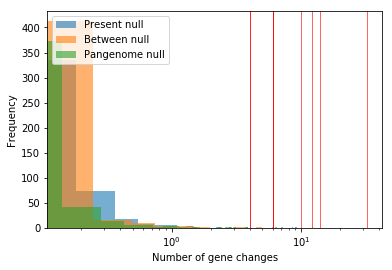

In [ ]:
fig, ax = plt.subplots()

cohorts = ['Mother-Infant(earliest)', 'Infant-Infant', 'Adult-Adult']

pres_hist = ax.hist(all_pres_null_counts, bins=50, alpha=0.6, label='Present null')
between_hist = ax.hist(all_btwn_null_counts, bins=50, alpha=0.6, label='Between null')
pang_hist = ax.hist(all_pang_null_counts, bins=50, alpha=0.6, label='Pangenome null')

for gene in any_parallel_genes:
    count = 0
    for cohort in cohorts:
        if gene in genes_by_cohort[cohort]:
            count += sum(genes_by_cohort[cohort][gene].values())
    ax.axvline(x=count, color='red', linewidth=0.6)

ax.set_xlabel("Number of gene changes")
ax.set_ylabel("Frequency")
ax.set_xscale('log')
ax.legend()

plt.show()

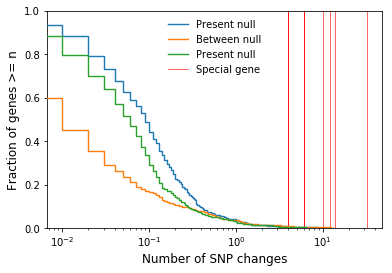

In [26]:
# Survival curve version
fig, ax = plt.subplots()

cohorts = ['Mother-Infant(earliest)', 'Infant-Infant', 'Adult-Adult']

xs, ns = calculate_unnormalized_survival_from_vector(all_pres_null_counts)
ax.step(xs,ns/float(ns[0]),'-',linewidth=1.4, label='Present null', where='pre',zorder=4)
xs, ns = calculate_unnormalized_survival_from_vector(all_btwn_null_counts)
ax.step(xs,ns/float(ns[0]),'-',linewidth=1.4, label='Between null', where='pre',zorder=4)
xs, ns = calculate_unnormalized_survival_from_vector(all_pang_null_counts)
ax.step(xs,ns/float(ns[0]),'-',linewidth=1.4, label='Present null', where='pre',zorder=4)

ax.set_ylim((0, 1))

for gene in any_parallel_genes:
    count = 0
    for cohort in cohorts:
        if gene in genes_by_cohort[cohort]:
            count += sum(genes_by_cohort[cohort][gene].values())
    ax.axvline(x=count, color='red', linewidth=0.6)

# Redundant for label
ax.axvline(x=count, color='red', linewidth=0.6, label="Special gene")

ax.set_xlabel("Number of SNP changes", fontsize=12)
ax.set_ylabel("Fraction of genes >= n", fontsize=12)
ax.set_xscale('log')
ax.legend(frameon=False)
# ax.legend(loc='center right', bbox_to_anchor=(1.397, 0.5), frameon=False, fontsize=11)

fig.savefig('%s/mutations_per_gene_nulls_survival_any.pdf' % plot_dir, bbox_inches='tight')
# fig.savefig('%s/mutations_per_gene_nulls_survival_any.png' % plot_dir, bbox_inches='tight', dpi=500)
plt.show()

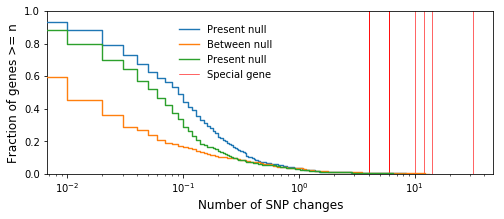

In [17]:
# Survival curve version (flattened)
fig, ax = plt.subplots(figsize=(8, 3))

xs, ns = calculate_unnormalized_survival_from_vector(all_pres_null_counts)
ax.step(xs,ns/float(ns[0]),'-',linewidth=1.4, label='Present null', where='pre',zorder=4)
xs, ns = calculate_unnormalized_survival_from_vector(all_btwn_null_counts)
ax.step(xs,ns/float(ns[0]),'-',linewidth=1.4, label='Between null', where='pre',zorder=4)
xs, ns = calculate_unnormalized_survival_from_vector(all_pang_null_counts)
ax.step(xs,ns/float(ns[0]),'-',linewidth=1.4, label='Present null', where='pre',zorder=4)

ax.set_ylim((0, 1))

for gene in any_parallel_genes:
    count = 0
    for cohort in cohorts:
        if gene in genes_by_cohort[cohort]:
            count += sum(genes_by_cohort[cohort][gene].values())
    ax.axvline(x=count, color='red', linewidth=0.6)

# Redundant for label
ax.axvline(x=count, color='red', linewidth=0.6, label="Special gene")

ax.set_xlabel("Number of SNP changes", fontsize=12)
ax.set_ylabel("Fraction of genes >= n", fontsize=12)
ax.set_xscale('log')
ax.legend(loc='upper center', bbox_to_anchor=(0.4, 0.97), frameon=False)
# ax.legend(loc='center right', bbox_to_anchor=(1.397, 0.5), frameon=False, fontsize=11)

# fig.savefig('%s/mutations_per_gene_nulls_survival_any.pdf' % plot_dir, bbox_inches='tight')
# fig.savefig('%s/mutations_per_gene_nulls_survival_any.png' % plot_dir, bbox_inches='tight', dpi=500)
plt.show()

In [18]:
ii_parallel_genes

['Outer membrane TonB-dependent transporter, utilization system for glycans and polysaccharides (PUL), SusC family',
 'Periplasmic ligand-binding sensor domain COG3292 / BaeS-type histidine kinase / OmpR-type DNA-binding response regulator',
 'Two-component system sensor histidine kinase',
 'Cell surface glycan-binding lipoprotein, utilization system for glycans and polysaccharides (PUL), SusD family',
 'Transcriptional regulator, AraC family',
 'beta-galactosidase (EC 3.2.1.23)',
 'Transcriptional regulator, LacI family',
 'Sporulation transcription regulator WhiA',
 'RND efflux system, membrane fusion protein']

In [28]:
# Make table
# Number of SNP changes/unique hosts having SNP changes per parallel gene and per timepoint pair category
parallel_genes = any_parallel_genes
custom_cohorts_ordered = ['Mother-Infant(earliest)', 'Infant-Infant', 'Adult-Adult']

parallel_genes_by_cohort = {gene: {tt: 0 for tt in custom_cohorts_ordered} for gene in parallel_genes}
count_by_parallel_gene = defaultdict(int)
host_parallel_genes_by_cohort = {gene: {tt: set() for tt in custom_cohorts_ordered} for gene in parallel_genes}

for cohort in custom_cohorts_ordered:
    for gene in genes_by_cohort[cohort]:
        if gene in parallel_genes:
            num_snp_changes = sum(genes_by_cohort[cohort][gene].values())
            num_subject_tuples = len(num_host_genes_by_cohort[cohort][gene])
            parallel_genes_by_cohort[gene][cohort] = num_snp_changes
            count_by_parallel_gene[gene] += num_snp_changes
            for subject_tuple in num_host_genes_by_cohort[cohort][gene]:
                host_parallel_genes_by_cohort[gene][cohort].add(subject_tuple)          

In [29]:
parallel_genes_ordered = []
for gene, count in sorted(count_by_parallel_gene.items(), key=lambda x: x[1], reverse=True):
    parallel_genes_ordered.append(gene)

In [85]:
# Store table

f = open('%s/parallel_gene_snp_changes_by_tp_type.tsv' % plot_dir, 'w')
f.write('\t'.join(['gene_name'] + custom_cohorts_ordered + ['Total'] + custom_cohorts_ordered + ['Total(unique)']) + '\n')

for gene in parallel_genes_ordered:
    counts = [parallel_genes_by_cohort[gene][cohort] for cohort in custom_cohorts_ordered]
    host_counts = [len(host_parallel_genes_by_cohort[gene][cohort]) for cohort in custom_cohorts_ordered]
    
    all_hosts = set()
    for cohort in custom_cohorts_ordered:
        fort host in host_parallel_genes_by_cohort[gene][cohort]:
            all_hosts.add(host)
    
    data = [gene] + counts + [sum(counts)] + host_counts + [len(all_hosts)]
    f.write('\t'.join([str(datum) for datum in data]) + '\n')

f.close()

SyntaxError: invalid syntax (<ipython-input-85-fece72d46329>, line 12)

Gene Outer membrane TonB-dependent transporter, utilization system for glycans and polysaccharides (PUL), SusC family | Mother-Infant(wk1)
Nothing
# SNP changes: 0
# hosts: 0

Gene Outer membrane TonB-dependent transporter, utilization system for glycans and polysaccharides (PUL), SusC family | Infant-Infant
2D: 0
4D: 4
1D: 10
3D: 1
# SNP changes: 15
# hosts: 12

Gene Outer membrane TonB-dependent transporter, utilization system for glycans and polysaccharides (PUL), SusC family | Adult-Adult
2D: 1
4D: 1
1D: 7
3D: 0
# SNP changes: 9
# hosts: 8

Gene Periplasmic ligand-binding sensor domain COG3292 / BaeS-type histidine kinase / OmpR-type DNA-binding response regulator | Mother-Infant(wk1)
Nothing
# SNP changes: 0
# hosts: 0

Gene Periplasmic ligand-binding sensor domain COG3292 / BaeS-type histidine kinase / OmpR-type DNA-binding response regulator | Infant-Infant
2D: 1
4D: 0
1D: 11
3D: 0
# SNP changes: 12
# hosts: 8

Gene Periplasmic ligand-binding sensor domain COG3292 / BaeS-type hi

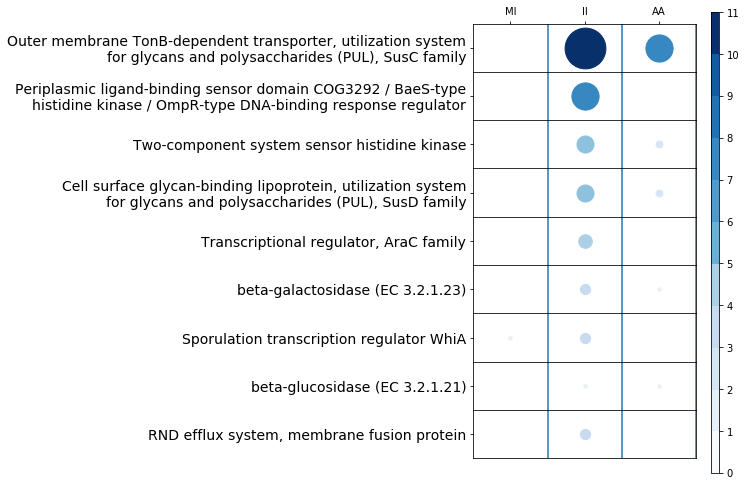

In [98]:
# Bubble plot
fig, ax = plt.subplots(len(parallel_genes_ordered), 1, figsize=(4,8), gridspec_kw={'wspace':0.025, 'hspace':0})

custom_bins = ['MI', 'II', 'AA']
cmap = cmx.get_cmap('Blues', 13)
colors = [cmap(x) for x in np.array([x for x in range(0,13)])/13.0]

mi_cohort_labels = []

gene_i = 0
for gene in parallel_genes_ordered:
    
    ax[gene_i].set_xlim((-0.5, len(custom_bins)-0.5))
    
    col_i = 0
    for tp_type, color in zip(['Mother-Infant(wk1)', 'Infant-Infant', 'Adult-Adult'], ['#7bb551', '#77acff', '#396651']):
        num_snp_changes = parallel_genes_by_cohort[gene][tp_type]
        num_hosts = len(host_parallel_genes_by_cohort[gene][tp_type])
        print("Gene %s | %s" % (gene, tp_type))
        if gene not in genes_by_cohort[tp_type]:
            print("Nothing")        
        else:
            for vartype in genes_by_cohort[tp_type][gene]:
                print("%s: %i" % (vartype, genes_by_cohort[tp_type][gene][vartype]))
        print("# SNP changes: %i" % num_snp_changes)
        print("# hosts: %i" % num_hosts)
        print('')
        ax[gene_i].plot([col_i], [gene_i], 'o', markersize = num_hosts*3.4, color=colors[num_hosts])
        col_i += 1
    
    ax[gene_i].set_yticks([gene_i])
    
    if len(gene) > 50:
        substrs = gene.split(' ')
        half_idx = (len(substrs)/2)
        half1 = ' '.join(substrs[:half_idx])
        half2 = ' '.join(substrs[half_idx:])
        gene_label = half1 + '\n' + half2
    else:
        gene_label = gene
    
    ax[gene_i].set_yticklabels([gene_label], fontsize=14)
    ax[gene_i].set_xticks([])
    for x in np.arange(0.5, len(custom_bins), step=1):
        ax[gene_i].axvline(x=x)
    gene_i += 1

ax[0].set_xticks(np.arange(len(custom_bins)))
ax[0].set_xticklabels(custom_bins)
ax[0].xaxis.tick_top()

# Add colorbar

# define the bins and normalize
bounds = np.arange(0, 12)
norm = mplcol.BoundaryNorm(bounds, cmap.N)

# create a second axes for the colorbar
ax2 = fig.add_axes([0.95, 0.1, 0.03, 0.8])
cb = colorbar.ColorbarBase(ax2, cmap=cmap, norm=norm,
    spacing='proportional', ticks=bounds, boundaries=bounds, format='%1i')

plt.tick_params(top=False)

fig.savefig('%s/parallel_genes_bubble_plot.pdf' % (config.analysis_directory),bbox_inches='tight')
fig.savefig('%s/parallel_genes_bubble_plot.png' % (config.analysis_directory),bbox_inches='tight', dpi=500)
plt.show()

In [23]:
# Get list of parallel changing genes: final version??
# Any gene NAME that changes in at least 3/4 hosts across infant-infant,
# mother-infant(earliest) or adult-adult categories

host_threshold = 4

gene_hosts_dict = defaultdict(set)

for cat in ['Mother-Infant(earliest)', 'Infant-Infant', 'Adult-Adult']:
    for gene in num_host_genes_by_cohort[cat]:
        hosts = num_host_genes_by_cohort[cat][gene]
        for host in hosts:
            gene_hosts_dict[gene].add(host)

gene_num_hosts_dict = {gene: len(gene_hosts_dict[gene]) for gene in gene_hosts_dict}

sorted_gene_num_hosts = sorted(gene_num_hosts_dict.items(), key=lambda x: x[1], reverse=True)

any_parallel_genes = []
for gene, num_hosts in sorted_gene_num_hosts:
    if num_hosts >= host_threshold:
        any_parallel_genes.append(gene)

any_parallel_genes.remove('hypothetical protein')

print("There are %i parallel genes that mutate in parallel across >=%i hosts" % (len(any_parallel_genes), host_threshold))

There are 14 parallel genes that mutate in parallel across >=4 hosts


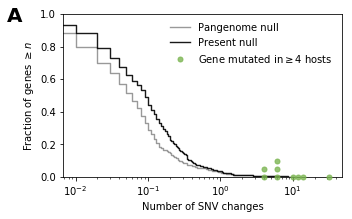

In [27]:
# Survival curve version (flattened)
parallel_actual_counts = []
parallel_pres_null_counts = []
parallel_btwn_null_counts = []
parallel_pang_null_counts = []

all_actual_counts = []
all_pres_null_counts = []
all_btwn_null_counts = []
all_pang_null_counts = []

# cohort -> gene -> variant type -> count of SNP changes
# Originally, only looked at one infant-infant cohort
# cohort = 'Infant-Infant'
cohorts = ['Mother-Infant(earliest)', 'Infant-Infant', 'Adult-Adult']

all_genes = []
for cohort in cohorts:
    all_genes += genes_by_cohort[cohort].keys()

all_genes = list(set(all_genes))

for gene in all_genes:
    
    # Skip hypothetical protein
    if gene == 'hypothetical protein':
        continue
    
    actual_count = 0
    pres_null_count = 0
    btwn_null_count = 0
    pang_null_count = 0
    
    for cohort in cohorts:
        
        # Skip if gene not present in cohort
        if gene not in genes_by_cohort[cohort]:
            continue
        
        pres_null_count += (genes_by_cohort_present_null[cohort][gene])
        btwn_null_count += (genes_by_cohort_between_null[cohort][gene])
        pang_null_count += (genes_by_cohort_pangenome_null[cohort][gene])
        actual_count += sum(genes_by_cohort[cohort][gene].values())
    
    # Store info
    all_actual_counts.append(actual_count)
    all_pres_null_counts.append(pres_null_count)
    all_btwn_null_counts.append(btwn_null_count)
    all_pang_null_counts.append(pang_null_count)

    # Store info only if gene is special
    if gene in any_parallel_genes:
        parallel_actual_counts.append(actual_count)
        parallel_pres_null_counts.append(pres_null_count)
        parallel_btwn_null_counts.append(btwn_null_count)
        parallel_pang_null_counts.append(pang_null_count)

fig, ax = plt.subplots(figsize=(5, 3))

# xs, ns = calculate_unnormalized_survival_from_vector(all_actual_counts)
# ax.step(xs,ns/float(ns[0]),'-',linewidth=1.4, label='Observed', where='pre',zorder=4)
# xs, ns = calculate_unnormalized_survival_from_vector(all_btwn_null_counts)
# ax.step(xs,ns/float(ns[0]),'-',linewidth=1.4, label='Between null', where='pre',zorder=4)
xs, ns = calculate_unnormalized_survival_from_vector(all_pang_null_counts)
ax.step(xs,ns/float(ns[0]),'-',linewidth=1.4, label='Pangenome null', where='pre',zorder=4, color='black', alpha=0.4)
xs, ns = calculate_unnormalized_survival_from_vector(all_pres_null_counts)
ax.step(xs,ns/float(ns[0]),'-',linewidth=1.4, label='Present null', where='pre',zorder=4, color='black', alpha=0.9)

ax.set_ylim((0, 1))

all_counts = []
for gene in any_parallel_genes:
    count = 0
    for cohort in cohorts:
        if gene in genes_by_cohort[cohort]:
            count += sum(genes_by_cohort[cohort][gene].values())
    # ax.axvline(x=count, color='red', linewidth=0.6)
    all_counts.append(count)

# all_counts_ys = [0]*len(all_counts)
all_counts_ys = []
count_y_sofar_dict = defaultdict(float)
for count in all_counts:
    all_counts_ys.append(count_y_sofar_dict[count])
    count_y_sofar_dict[count] += 0.05

point = ax.plot(all_counts, all_counts_ys, '.', color='#7bb551', alpha=0.8, # #ff7f00
                markersize=10, zorder=99, label=('Gene mutated ' + r'in$\geq$4 hosts'))[0]
point.set_clip_on(False)
# ax.annotate(xy=(count, 0))

# Redundant for label
# ax.axvline(x=count, color='red', linewidth=0.6, label=('Gene mutated\n' + r'in$\geq$4 hosts'))

ax.set_xlabel("Number of SNV changes")
ax.set_ylabel(r'Fraction of genes $\geq \it{n}$')
ax.set_xscale('log')
ax.legend(loc='upper right', frameon=False) #,bbox_to_anchor=(0.5, 0.97))
ax.text(-0.2, 0.95, 'A', size=20, transform=ax.transAxes, weight='bold')
# ax.legend(loc='center right', bbox_to_anchor=(1.397, 0.5), frameon=False, fontsize=11)

# Circles on the x axis that are translucent
plt.show()

fig.savefig('%s/mutations_per_gene_nulls_survival_any.pdf' % plot_dir, bbox_inches='tight')
# fig.savefig('%s/mutations_per_gene_nulls_survival_any.png' % plot_dir, bbox_inches='tight', dpi=500)

In [28]:
# Make table
# Number of SNP changes/unique hosts having SNP changes per parallel gene and per timepoint pair category
parallel_genes = any_parallel_genes
custom_cohorts_ordered = ['Mother-Infant(earliest)', 'Infant-Infant', 'Adult-Adult']

parallel_genes_by_cohort = {gene: {tt: 0 for tt in custom_cohorts_ordered} for gene in parallel_genes}
count_by_parallel_gene = defaultdict(int)
host_parallel_genes_by_cohort = {gene: {tt: set() for tt in custom_cohorts_ordered} for gene in parallel_genes}

for cohort in custom_cohorts_ordered:
    for gene in genes_by_cohort[cohort]:
        if gene in parallel_genes:
            num_snp_changes = sum(genes_by_cohort[cohort][gene].values())
            num_subject_tuples = len(num_host_genes_by_cohort[cohort][gene])
            parallel_genes_by_cohort[gene][cohort] = num_snp_changes
            count_by_parallel_gene[gene] += num_snp_changes
            for subject_tuple in num_host_genes_by_cohort[cohort][gene]:
                host_parallel_genes_by_cohort[gene][cohort].add(subject_tuple)

parallel_genes_ordered = []
for gene, count in sorted(count_by_parallel_gene.items(), key=lambda x: x[1], reverse=True):
    parallel_genes_ordered.append(gene)

Gene Outer membrane TonB-dependent transporter, utilization system for glycans and polysaccharides (PUL), SusC family | Mother-Infant(earliest)
2D: 1
4D: 2
1D: 5
3D: 0
# SNP changes: 8
# hosts: 6

Gene Outer membrane TonB-dependent transporter, utilization system for glycans and polysaccharides (PUL), SusC family | Infant-Infant
2D: 0
4D: 4
1D: 10
3D: 1
# SNP changes: 15
# hosts: 12

Gene Outer membrane TonB-dependent transporter, utilization system for glycans and polysaccharides (PUL), SusC family | Adult-Adult
2D: 1
4D: 1
1D: 7
3D: 0
# SNP changes: 9
# hosts: 8

Gene Periplasmic ligand-binding sensor domain COG3292 / BaeS-type histidine kinase / OmpR-type DNA-binding response regulator | Mother-Infant(earliest)
2D: 0
4D: 0
1D: 2
3D: 0
# SNP changes: 2
# hosts: 2

Gene Periplasmic ligand-binding sensor domain COG3292 / BaeS-type histidine kinase / OmpR-type DNA-binding response regulator | Infant-Infant
2D: 1
4D: 0
1D: 11
3D: 0
# SNP changes: 12
# hosts: 8

Gene Periplasmic ligand-bi

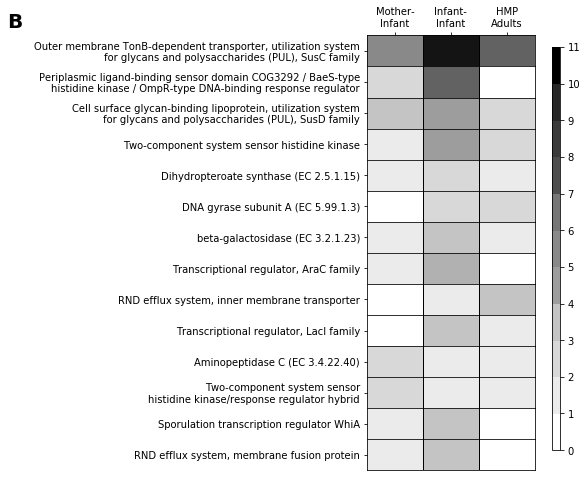

In [30]:
# Heatmap plot
fig, ax = plt.subplots(len(parallel_genes_ordered), 1, figsize=(3,8), gridspec_kw={'wspace':0.025, 'hspace':0})

custom_bins = ['Mother-\nInfant', 'Infant-\nInfant', 'HMP\nAdults']
cmap = cmx.get_cmap('binary', 14) # Blues
colors = [cmap(x) for x in np.array([x for x in range(0,14)])/14.0]

mi_cohort_labels = []

gene_i = 0
for gene in parallel_genes_ordered:
    
    ax[gene_i].set_xlim((-0.5, len(custom_bins)-0.5))
    if len(gene) > 50:
        substrs = gene.split(' ')
        half_idx = (len(substrs)/2)
        half1 = ' '.join(substrs[:half_idx])
        half2 = ' '.join(substrs[half_idx:])
        gene_label = half1 + '\n' + half2
    else:
        gene_label = gene
    
    ax[gene_i].set_yticks([0.5])
    ax[gene_i].set_yticklabels([gene_label])
    ax[gene_i].set_xticks([])
    
    col_i = 0
    for tp_type, color in zip(['Mother-Infant(earliest)', 'Infant-Infant', 'Adult-Adult'], ['#7bb551', '#77acff', '#396651']):
        num_snp_changes = parallel_genes_by_cohort[gene][tp_type]
        num_hosts = len(host_parallel_genes_by_cohort[gene][tp_type])
        
        print("Gene %s | %s" % (gene, tp_type))
        if gene not in genes_by_cohort[tp_type]:
            print("Nothing")        
        else:
            for vartype in genes_by_cohort[tp_type][gene]:
                print("%s: %i" % (vartype, genes_by_cohort[tp_type][gene][vartype]))
        print("# SNP changes: %i" % num_snp_changes)
        print("# hosts: %i" % num_hosts)
        print('')
        
        ax[gene_i].axvspan(col_i-0.5, col_i+0.5, facecolor=colors[num_hosts])
        ax[gene_i].axvline(col_i+0.5, color='black', linewidth=1)
        # ax[gene_i].plot([col_i], [gene_i], 'o', markersize = num_hosts*3.4, color=colors[num_hosts])
        col_i += 1
    
    gene_i += 1

ax[0].set_xticks(np.arange(len(custom_bins)))
ax[0].set_xticklabels(custom_bins)
ax[0].xaxis.tick_top()

# Add colorbar

# define the bins and normalize
bounds = np.arange(0, 12)
norm = mplcol.BoundaryNorm(bounds, cmap.N)

# create a second axes for the colorbar
ax2 = fig.add_axes([0.98, 0.16, 0.04, 0.7])
cb = colorbar.ColorbarBase(ax2, cmap=cmap, norm=norm,
    spacing='proportional', ticks=bounds, boundaries=bounds, format='%1i')

ax[0].text(-2.15, 1.25, 'B', size=20, transform=ax[0].transAxes, weight='bold')
plt.tick_params(top=False)

plt.show()

fig.savefig('%s/parallel_genes_heatmap.pdf' % (config.analysis_directory),bbox_inches='tight')
fig.savefig('%s/parallel_genes_heatmap.png' % (config.analysis_directory),bbox_inches='tight', dpi=700)

In [28]:
# Try to make plot like Zhao and Lieberman 4D

host_threshold = 4
gene_hosts_dict = defaultdict(set)

for cat in ['Infant-Infant', 'Adult-Adult', 'Mother-Infant(earliest)']:
    for gene in num_host_genes_by_cohort[cat]:
        hosts = num_host_genes_by_cohort[cat][gene]
        for host in hosts:
            gene_hosts_dict[gene].add(host)

gene_num_hosts_dict = {gene: len(gene_hosts_dict[gene]) for gene in gene_hosts_dict}
sorted_gene_num_hosts = sorted(gene_num_hosts_dict.items(), key=lambda x: x[1], reverse=True)
'''
# Infant-infant:
ii_parallel_genes = ['Periplasmic ligand-binding sensor domain COG3292 / BaeS-type histidine kinase / OmpR-type DNA-binding response regulator',
                    'Outer membrane TonB-dependent transporter, utilization system for glycans and polysaccharides (PUL), SusC family',
                    'Cell surface glycan-binding lipoprotein, utilization system for glycans and polysaccharides (PUL), SusD family',
                    'Two-component system sensor histidine kinase', 'beta-galactosidase (EC 3.2.1.23)',
                    'Transcriptional regulator, AraC family', 'Sporulation transcription regulator WhiA']

'''
ii_parallel_genes = []
for gene, num_hosts in sorted_gene_num_hosts:
    if num_hosts >= host_threshold:
        ii_parallel_genes.append(gene)

ii_parallel_genes.remove('hypothetical protein')
print("There are %i parallel genes that mutate in parallel across >=%i hosts" % (len(ii_parallel_genes), host_threshold))

# dN/dS for parallel changing genes
# dN/dS of all SNP changes, excluding those that are involved in parallelism
# dN/dS between hosts: very low

# Report SNPs per base pair, if concerned about longer genes obscuring parallelism signal

variant_types = ['4D', '1D', '2D', '3D']

dnds_replacement = ([], [], [], []) # Replacements
dnds_mod_other = ([], [], [], []) # Tuple of four lists corresponding to N diffs, N opps, S diffs, S opps
dnds_parallel = ([], [], [], [])
snps_per_bp = ([], [], [], [])

for species in snp_changes_consecutive:
    
    # print("Working on %s...." % species)
    genome_ids = midas_db_utils.get_ref_genome_ids(species)
    # load the gene descriptions for all genomes coresponding to this speceis:
    # gene_descriptions=parse_patric.load_patric_gene_descriptions(genome_ids)
    
    for sample_i, sample_j in snp_changes[species]:
        
        val = snp_changes[species][(sample_i, sample_j)]
        subject_tuple = (sample_subject_map[sample_i], sample_subject_map[sample_j])
        custom_cohorts = custom_cohorts_of_sample_pair(custom_cohort_tests, sample_i, sample_j)
        
        # Originally just looking at II
        # Now look at Mother-Infant(earliest), Infant-Infant, Adult-Adult
        # if not (('Infant-Infant' in custom_cohorts)): 
        #     continue
        if not (('Infant-Infant' in custom_cohorts) or ('Mother-Infant(earliest)' in custom_cohorts) or ('Adult-Adult' in custom_cohorts)):
            continue
        # if not (('Infant-Infant' in custom_cohorts) or ('Mother-Infant(earliest)' in custom_cohorts)):
        #     continue
        
        # Get dN/dS info
        nonsyn_diffs, nonsyn_opps, syn_diffs, syn_opps = dnds_info[species][(sample_i, sample_j)]
        
        if type(val) == type([]): # Not a replacement
            
            # Loop over individual SNP changes
            for gene_id, contig, position, variant_type, A1, D1, A2, D2 in val:

                desc = gene_id_name_map[gene_id]
                if desc in ii_parallel_genes: # any_parallel_genes
                    dnds_parallel[0].append(nonsyn_diffs)
                    dnds_parallel[1].append(nonsyn_opps)
                    dnds_parallel[2].append(syn_diffs)
                    dnds_parallel[3].append(syn_opps)
                else:
                    dnds_mod_other[0].append(nonsyn_diffs)
                    dnds_mod_other[1].append(nonsyn_opps)
                    dnds_mod_other[2].append(syn_diffs)
                    dnds_mod_other[3].append(syn_opps)
            
        else: # Replacement, val is number of SNP differences
            dnds_replacement[0].append(nonsyn_diffs)
            dnds_replacement[1].append(nonsyn_opps)
            dnds_replacement[2].append(syn_diffs)
            dnds_replacement[3].append(syn_opps)

There are 14 parallel genes that mutate in parallel across >=4 hosts


In [29]:
for x in ii_parallel_genes:
    print(x)

Outer membrane TonB-dependent transporter, utilization system for glycans and polysaccharides (PUL), SusC family
Cell surface glycan-binding lipoprotein, utilization system for glycans and polysaccharides (PUL), SusD family
Periplasmic ligand-binding sensor domain COG3292 / BaeS-type histidine kinase / OmpR-type DNA-binding response regulator
Two-component system sensor histidine kinase
Transcriptional regulator, AraC family
beta-galactosidase (EC 3.2.1.23)
Transcriptional regulator, LacI family
RND efflux system, inner membrane transporter
Aminopeptidase C (EC 3.4.22.40)
Sporulation transcription regulator WhiA
RND efflux system, membrane fusion protein
Dihydropteroate synthase (EC 2.5.1.15)
Two-component system sensor histidine kinase/response regulator hybrid
DNA gyrase subunit A (EC 5.99.1.3)


In [59]:
dnds_mod_other_actual = (sum(dnds_mod_other[0])/sum(dnds_mod_other[1]))/(sum(dnds_mod_other[2])/sum(dnds_mod_other[3]))
dnds_mod_other_length = len(dnds_mod_other[2])
dnds_parallel_actual = (sum(dnds_parallel[0])/sum(dnds_parallel[1]))/(sum(dnds_parallel[2])/sum(dnds_parallel[3]))
dnds_parallel_length = len(dnds_parallel[2])
dnds_replacement_actual = (sum(dnds_replacement[0])/sum(dnds_replacement[1]))/(sum(dnds_replacement[2])/sum(dnds_replacement[3]))
dnds_replacement_length = len(dnds_replacement[2])

print(dnds_mod_other_actual)
print(dnds_parallel_actual)
print(dnds_replacement_actual)

0.5638728218537569
1.001406416959885
0.11552464868126135


T: 53.85	p: 0.0
D: 2.4082986354792317


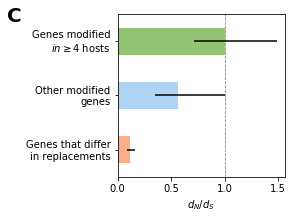

In [60]:
# Bootstrap dN/dS values and perform T-test between special parallel genes and other changing genes
# Subsample to 50 SNP changes without replacement

num_trials = 1000
lower_ci_idx = int(num_trials*0.025)
upper_ci_idx = int(num_trials*0.975)
subsample_size = 50

parallel_dnds_list = []
mod_other_dnds_list = []
replacement_dnds_list = []

for _ in range(num_trials):
    for dnds_cat, dnds_list in zip([dnds_parallel, dnds_mod_other, dnds_replacement], 
                                   [parallel_dnds_list, mod_other_dnds_list, replacement_dnds_list]):
        nonsyn_diffs = np.random.choice(dnds_cat[0], size=subsample_size, replace=False)
        nonsyn_opps = np.random.choice(dnds_cat[1], size=subsample_size, replace=False)
        syn_diffs = np.random.choice(dnds_cat[2], size=subsample_size, replace=False)
        syn_opps = np.random.choice(dnds_cat[3], size=subsample_size, replace=False)
        
        dnds = (sum(nonsyn_diffs)/sum(nonsyn_opps))/(sum(syn_diffs)/sum(syn_opps))
        
        dnds_list.append(dnds)

import scipy.stats as stats
t, p = stats.ttest_ind(parallel_dnds_list, mod_other_dnds_list)
D = cohenD(parallel_dnds_list, mod_other_dnds_list)
print("T: %.02f\tp: %s" % (t, str(p)))
print("D: %s" % str(D))

fig, ax = plt.subplots(figsize=(3, 3))

xs = [2.5, 1.5, 0.5] # These are the bar indices, should be ys if horizontal bars
colors = ['#7bb551', '#9ec9f1', '#fd996a']
# ['#ff7f00', '#9ec9f1', '#fd996a'] # '#deebf7', '#fee0d2'] '#fd996a'
for x, val, color in zip(xs, [dnds_parallel_actual, dnds_mod_other_actual, dnds_replacement_actual], colors):
    ax.barh([x], val, height=0.5, color=color, alpha=0.8)
ax.hlines(xs[0], sorted(parallel_dnds_list)[lower_ci_idx], sorted(parallel_dnds_list)[upper_ci_idx])
ax.hlines(xs[1], sorted(mod_other_dnds_list)[lower_ci_idx], sorted(mod_other_dnds_list)[upper_ci_idx])
ax.hlines(xs[2], sorted(replacement_dnds_list)[lower_ci_idx], sorted(replacement_dnds_list)[upper_ci_idx])

ax.axvline(x=1, ls='--', linewidth=0.8, color='black', alpha=0.5, zorder=-99)

ax.set_ylim((0, 3))
ax.set_yticks(xs)
ax.set_yticklabels(['Genes modified\n' + r'$in\geq$4 hosts', 'Other modified\ngenes', 'Genes that differ\nin replacements'])
ax.text(-0.66, 0.95, 'C', size=20, transform=ax.transAxes, weight='bold')
ax.set_xlabel(r'$d_N/d_S$')
# plt.boxplot([parallel_dnds_list, mod_other_dnds_list, replacement_dnds_list])
plt.show()

fig.savefig('%s/parallel_genes_dnds.pdf' % (config.analysis_directory),bbox_inches='tight')
# fig.savefig('%s/parallel_genes_dnds.png' % (config.analysis_directory),bbox_inches='tight', dpi=500)

T: 0.31	p: 0.7572860522842055
D: 0.050444037126622605


{'boxes': [<matplotlib.lines.Line2D at 0x2b9ba8e49f90>,
 'caps': [<matplotlib.lines.Line2D at 0x2b9be144ce10>,
 'fliers': [<matplotlib.lines.Line2D at 0x2b9b984eed50>,
 'means': [],
 'medians': [<matplotlib.lines.Line2D at 0x2b9be144c8d0>,
 'whiskers': [<matplotlib.lines.Line2D at 0x2b9ba8e49950>,
  <matplotlib.lines.Line2D at 0x2b9bb211af10>]}

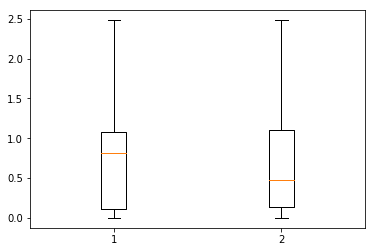

In [62]:
# T-test on the raw data
nonsyn_diffs, nonsyn_opps, syn_diffs, syn_opps = dnds_parallel
dnds_parallel_actual = []
for i in range(len(nonsyn_diffs)):
    if syn_diffs[i] == 0:
        pass
    else:
        dnds_parallel_actual.append((nonsyn_diffs[i]/nonsyn_opps[i])/(syn_diffs[i]/syn_opps[i]))

nonsyn_diffs, nonsyn_opps, syn_diffs, syn_opps = dnds_mod_other
dnds_mod_other_actual = []
for i in range(len(nonsyn_diffs)):
    if syn_diffs[i] == 0:
        pass
    else:
        dnds_mod_other_actual.append((nonsyn_diffs[i]/nonsyn_opps[i])/(syn_diffs[i]/syn_opps[i]))

t, p = stats.ttest_ind(dnds_parallel_actual, dnds_mod_other_actual)
D = cohenD(dnds_parallel_actual, dnds_mod_other_actual)
print("T: %.02f\tp: %s" % (t, str(p)))
print("D: %s" % str(D))

plt.boxplot([dnds_parallel_actual, dnds_mod_other_actual])

In [63]:
# Permutation test?

def permutation_test(orig_label_data_dict, label_set, aggregator_fn, num_bootstraps=1000):
    
    orig_data = []; labels = []
    for label in label_set:
        for orig_datum in orig_label_data_dict[label]:
            orig_data.append(orig_datum)
            labels.append(label)
    
    # First compute true rate
    true_value_by_label = {label: aggregator_fn(orig_label_data_dict[label]) for label in orig_label_data_dict}
    
    # Next compute null rates
    permuted_values_by_label = {label: [] for label in label_set}
    
    for _ in range(num_bootstraps):        
        random.shuffle(labels) # Randomly permute labels    
        label_data_dict = defaultdict(list)
        for datum, label in zip(orig_data, labels):
            label_data_dict[label].append(datum)
        
        for label in label_set:
            permuted_values_by_label[label].append(aggregator_fn(label_data_dict[label]))
    
    # Compute differences between the labels
    label1, label2 = label_set[0], label_set[1]
    
    null_differences = []
    for val1, val2 in zip(permuted_values_by_label[label1], permuted_values_by_label[label2]):
        null_differences.append(val1-val2)
    
    true_difference = true_value_by_label[label1]-true_value_by_label[label2]
    
    return (null_differences, true_difference)

In [83]:
def get_overall_dnds(vals):
    total_nonsyn_diff = 0.0
    total_nonsyn_opp = 0.0
    total_syn_diff = 0.0
    total_syn_opp = 0.0
    for nonsyn_diff, nonsyn_opp, syn_diff, syn_opp in vals:
        total_nonsyn_diff += nonsyn_diff
        total_nonsyn_opp += nonsyn_opp
        total_syn_diff += syn_diff
        total_syn_opp += syn_opp
    return ((total_nonsyn_diff/total_nonsyn_opp)/(total_syn_diff/total_syn_opp))

def permutation_test_p(nulls, true):
    # Firstly check if true is above or below median
    median = np.median(nulls); n = len(nulls)
    if true < median: # Below median
        sorted_nulls = sorted(nulls)
        for rank, null in zip(np.arange(0, n), sorted_nulls):
            if true < null:
                return rank/float(n)
    else: # Above median
        sorted_nulls = sorted(nulls, reverse=True)
        for rank, null in zip(np.arange(n, 0, step=-1), sorted_nulls):
            if true > null:
                return 1-(rank/float(n))

0.0010000000000000009


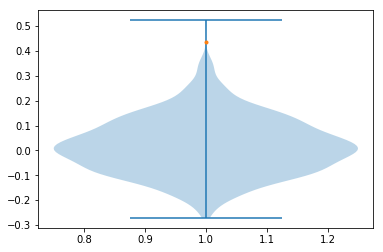

In [87]:
null_differences, true_difference = permutation_test(orig_label_data_dict, ['parallel', 'mod_other'], get_overall_dnds, num_bootstraps=1000)
print(permutation_test_p(null_differences, true_difference))
plt.violinplot(null_differences)
plt.plot([1], [true_difference], '.')

In [57]:
t, p = stats.ttest_ind(parallel_dnds_list[:3], mod_other_dnds_list[:3])
print("T: %.02f\tp: %.3E" % (t, p))

T: 3.21	p: 3.266E-02


Max number excluding hypothetical protein: 26 for Outer membrane TonB-dependent transporter, utilization system for glycans and polysaccharides (PUL), SusC family


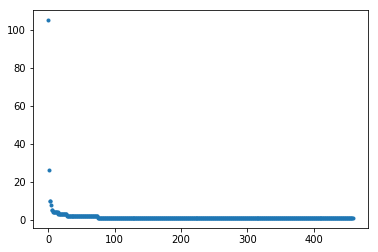

In [38]:
# Distribution of values of number of parallel mutated hosts per gene ID
plt.plot([num for _, num in sorted_gene_num_hosts], '.')

for gene, num in sorted_gene_num_hosts:
    if num > 20 and gene != 'hypothetical protein':
        print("Max number excluding hypothetical protein: %i for %s" % (num, gene))
plt.show()

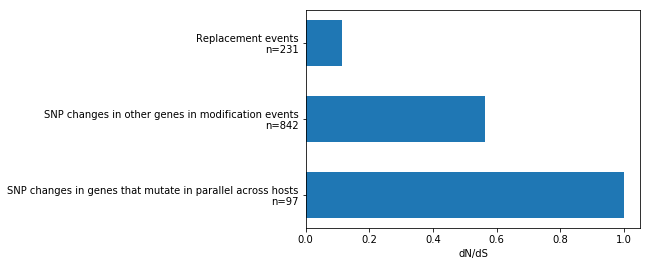

In [39]:
fig, ax = plt.subplots()

dnds_lens = [len(dnds_list) for dnds_list in [dnds_parallel[0], dnds_mod_other[0], dnds_replacement[0]]]

ys = np.arange(3)
ax.barh(ys, [dnds_parallel_actual, dnds_mod_other_actual, dnds_replacement_actual], height=0.6)
ax.set_yticks(ys)

labels = ['SNP changes in genes that mutate in parallel across hosts',
                   'SNP changes in other genes in modification events',
                   'Replacement events']

new_labels = []
for label, dnds_len in zip(labels, dnds_lens):
    new_labels.append(label + ('\nn=%i' % dnds_len))

ax.set_yticklabels(new_labels)
ax.set_xlabel("dN/dS")

plt.show()

In [143]:
# Now try bootstrapping

subsample_size = 30
num_bootstraps = 100

dnds_parallel_actual = []
dnds_mod_other_actual = []
dnds_relacement_actual = []

for _ in range(num_bootstraps):

    dnds_mod_other_bootstrapped = [[], [], [], []]

    i = 0
    for elem in dnds_mod_other:
        print(len(elem))
        bootstrap = np.random.choice(elem, size=subsample_size, replace=False)
        dnds_mod_other_bootstrapped[i] = bootstrap
        i += 1

    dnds_parallel_bootstrapped = [[], [], [], []]

    i = 0
    for elem in dnds_parallel:
        bootstrap = np.random.choice(elem, size=subsample_size, replace=False)
        dnds_parallel_bootstrapped[i] = bootstrap
        i += 1

    dnds_replacement_bootstrapped = [[], [], [], []]

    i = 0
    for elem in dnds_replacement:
        bootstrap = np.random.choice(elem, size=subsample_size, replace=False)
        dnds_replacement_bootstrapped[i] = bootstrap
        i += 1

    dnds_mod_other_actual.append(sum(dnds_mod_other_bootstrapped[0])/sum(dnds_mod_other_bootstrapped[1]))/(sum(dnds_mod_other_bootstrapped[2])/sum(dnds_mod_other_bootstrapped[3]))
    dnds_mod_other_length = len(dnds_mod_other_bootstrapped[2])
    dnds_parallel_actual.append(sum(dnds_parallel_bootstrapped[0])/sum(dnds_parallel_bootstrapped[1]))/(sum(dnds_parallel_bootstrapped[2])/sum(dnds_parallel_bootstrapped[3]))
    dnds_parallel_length = len(dnds_parallel_bootstrapped[2])
    dnds_replacement_actual.append(sum(dnds_replacement_bootstrapped[0])/sum(dnds_replacement_bootstrapped[1]))/(sum(dnds_replacement_bootstrapped[2])/sum(dnds_replacement_bootstrapped[3]))
    dnds_replacement_length = len(dnds_replacement_bootstrapped[2])

print(dnds_mod_other_actual)
print(dnds_parallel_actual)
print(dnds_replacement_actual)

500
500
500
500


TypeError: unsupported operand type(s) for /: 'NoneType' and 'float'

In [145]:
len(dnds_mod_other_bootstrapped)

4

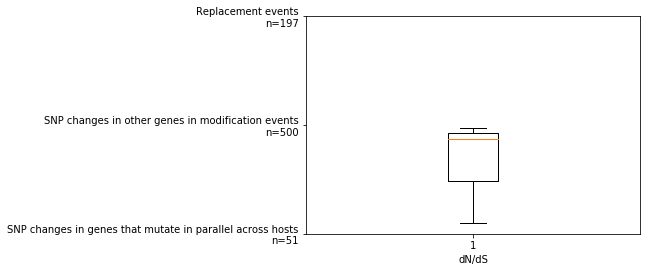

In [138]:
fig, ax = plt.subplots()

dnds_lens = [len(dnds_list) for dnds_list in [dnds_parallel[0], dnds_mod_other[0], dnds_replacement[0]]]

ys = np.arange(3)
ax.boxplot([dnds_parallel_actual, dnds_mod_other_actual, dnds_replacement_actual])
ax.set_yticks(ys)

labels = ['SNP changes in genes that mutate in parallel across hosts',
                   'SNP changes in other genes in modification events',
                   'Replacement events']

new_labels = []
for label, dnds_len in zip(labels, dnds_lens):
    new_labels.append(label + ('\nn=%i' % dnds_len))

ax.set_yticklabels(new_labels)
ax.set_xlabel("dN/dS")

plt.show()

In [25]:
# Do suspected de novo mutations in infants revert within hosts?

# subject -> species -> (day1, day2) -> list of SNP change tuples OR 'replacement'
host_snp_changes = defaultdict(dict)
# subject -> species -> (day1, day2) -> list of (vartype, fdict) tuples OR 'replacement
host_snp_changes_freqs = defaultdict(dict)

for species in snp_changes: # snp_changes_consecutive
    for sample_i, sample_j in snp_changes[species]: #snp_changes_consecutive
        
        custom_cohorts = custom_cohorts_of_sample_pair(custom_cohort_tests, sample_i, sample_j)
        if not ('Infant-Infant' in custom_cohorts or 'Mother-Infant(earliest)' in custom_cohorts): # Only look at mother-infant or infant-infant
            continue
        
        if 'Infant-Infant' in custom_cohorts:
            tp_type = 'II'
        if 'Mother-Infant(earliest)' in custom_cohorts:
            tp_type = 'MI'
        
        subject = sample_subject_map[sample_j][:-2] # Combine mother and infant subjects!
        day1, day2 = mi_sample_day_dict[sample_i], mi_sample_day_dict[sample_j]
        
        # Only consider Mother-Infant when mother timepoint is at delivery
        if tp_type == 'MI' and (day1 < 0 or day1 > 5):
            continue
        
        pdicts = snp_change_freqs_with_opps[species][(sample_i, sample_j)] # list of (vartype, freq_dict, opp_dict tuples)
        npdict = snp_change_null_freqs[species][(sample_i, sample_j)] # dict: prev_cohort > list of (freq, weight) tuples
        
        snp_change_val = snp_changes[species][(sample_i, sample_j)]
        
        nonsyn_diffs, nonsyn_opps, syn_diffs, syn_opps = dnds_info[species][(sample_i, sample_j)]        
        
        if type(snp_change_val) == type(1): # Replacement
            # continue # remove this to include replacement
            try:
                host_snp_changes[subject][species][(day1, day2, tp_type)] = 'replacement'
                host_snp_changes_freqs[subject][species][(day1, day2, tp_type)] = 'replacement'
            except:
                host_snp_changes[subject][species] = {(day1, day2, tp_type): 'replacement'}
                host_snp_changes_freqs[subject][species] = {(day1, day2, tp_type): 'replacement'}
        else: # elif len(snp_change_val) > 0: # formerly else to include no change
            try:
                host_snp_changes[subject][species][(day1, day2, tp_type)] = snp_changes[species][(sample_i, sample_j)]
                host_snp_changes_freqs[subject][species][(day1, day2, tp_type)] = pdicts
            except:
                host_snp_changes[subject][species] = {(day1, day2, tp_type): snp_changes[species][(sample_i, sample_j)]}
                host_snp_changes_freqs[subject][species] = {(day1, day2, tp_type): pdicts}

In [87]:
# Investigate Backhed 59
species = 'Bifidobacterium_adolescentis_56815'
for sample_i, sample_j in snp_changes_consecutive[species]:
    custom_cohorts = custom_cohorts_of_sample_pair(custom_cohort_tests, sample_i, sample_j)
    subject = sample_subject_map[sample_j][:-2] # Combine mother and infant subjects!
    day1, day2 = mi_sample_day_dict[sample_i], mi_sample_day_dict[sample_j]
    if subject == '59':
        print((day1, day2, custom_cohorts))
        print(snp_changes[species][(sample_i, sample_j)])
        print('')

(2, 3, set(['Mother-Infant(wk1)', 'Mother-Infant(all)']))
6809

(2, 366, set(['Mother-Infant(all)']))
[('592977.3.peg.642', 'JGZQ01000005', 14361L, '1D', 3.0, 38.0, 37.0, 37.0), ('592977.3.peg.860', 'JGZQ01000006', 69020L, '1D', 7.0, 44.0, 66.0, 66.0), ('592977.3.peg.1216', 'JGZQ01000008', 284119L, '2D', 0.0, 21.0, 46.0, 46.0), ('592977.3.peg.1129', 'JGZQ01000008', 186577L, '4D', 23.0, 28.0, 0.0, 38.0)]

(122, 366, set(['Month 1-Year 1', 'Infant-Infant']))
[('592977.3.peg.1705', 'JGZQ01000009', 29026L, '4D', 0.0, 209.0, 58.0, 58.0), ('592977.3.peg.642', 'JGZQ01000005', 14361L, '1D', 0.0, 296.0, 37.0, 37.0), ('592977.3.peg.860', 'JGZQ01000006', 69020L, '1D', 0.0, 302.0, 66.0, 66.0), ('592977.3.peg.1216', 'JGZQ01000008', 284119L, '2D', 0.0, 176.0, 46.0, 46.0), ('592977.3.peg.39', 'JGZQ01000001', 53358L, '1D', 272.0, 288.0, 0.0, 46.0), ('592977.3.peg.1129', 'JGZQ01000008', 186577L, '4D', 225.0, 230.0, 0.0, 38.0), ('592977.3.peg.1732', 'JGZQ01000009', 58203L, '4D', 186.0, 192.0, 0.0, 48.0)

In [64]:
num_host_species_pairs = 0
num_host_species_pairs_modification_twice = 0
desired_host_species_sites = []

for subject in host_snp_changes:
    for species in host_snp_changes[subject]:
        
        # Want to only keep earliest mother-infant timepoint pair urgh
        mi_min_day2 = 9999            
        for day1, day2, tp_type in sorted(host_snp_changes[subject][species].keys(), key=lambda x: x[0]):
            if tp_type == 'MI' and day2 < mi_min_day2:
                mi_min_day2 = day2

        mi_other_day2 = []
        for day1, day2, tp_type in sorted(host_snp_changes[subject][species].keys(), key=lambda x: x[0]):
            if tp_type == 'MI' and day2 != mi_min_day2:
                mi_other_day2.append(day2)
        
        if (len(host_snp_changes[subject][species]) - len(mi_other_day2)) > 1: # More than one tp pair
            
            num_host_species_pairs += 1
            
            # Check if there are at least two modification events
            num_modifications = 0
            for day1, day2, tp_type in sorted(host_snp_changes[subject][species].keys(), key=lambda x: x[0]):
                if tp_type == 'MI' and day2 != mi_min_day2:
                    continue                
                snp_change_list = host_snp_changes[subject][species][(day1, day2, tp_type)]
                if snp_change_list != 'replacement' and len(snp_change_list) > 0: # If this is a modification..
                    num_modifications += 1
            
            if num_modifications >= 2:
                num_host_species_pairs_modification_twice += 1
            else: # Comment out to see everything, keep to restrict to modification twice
                continue
            
            print("Subject: %s, Species: %s" % (subject, species))
            sites = []            
            
            for day1, day2, tp_type in sorted(host_snp_changes[subject][species].keys(), key=lambda x: x[0]):
                
                # Want to only keep earliest mother-infant timepoint pair urgh
                if tp_type == 'MI' and day2 != mi_min_day2:
                    continue
                
                print('\n%s Day %i to day %i' % (tp_type, day1, day2))
                snp_change_list = host_snp_changes[subject][species][(day1, day2, tp_type)]
                snp_change_freqs_list = host_snp_changes_freqs[subject][species][(day1, day2, tp_type)]
                
                if snp_change_list == 'replacement':
                        print("Replacement")
                        continue
                
                for snp_change, x_snp_change_freqs in zip(snp_change_list, snp_change_freqs_list):
                    gene_id, contig, location, vartype, a1, d1, a2, d2 = snp_change
                    
                    try:
                        gene_name = gene_id_name_map[gene_id]
                    except:
                        gene_name = 'Lack gene name info :('
                    
                    vartype2, freq_dict, opp_dict = x_snp_change_freqs
                    if vartype != vartype2:
                        print("Weird")
                    sites.append((gene_id, contig, location))
                    print("Site: %s,%s,%s\t| Vartype: %s | %s" % (gene_id, contig, location, vartype, gene_name))
                    print("\t%i %i %i %i | %.02f -> %.02f" % (a1, d1, a2, d2, float(a1)/d1, float(a2)/d2))
                    print("\tInfant prev: %.02f | HMP prev: %.02f | Mother prev: %.02f" % (freq_dict['nonpremie'], freq_dict['hmp'], freq_dict['mother']))
            desired_host_species_sites.append(([subject], species, sites))
            print("\n=============================================================================")

Subject: A00021_T2, Species: Enterococcus_faecium_56710

II Day 4 to day 7
Site: 1352.382.peg.338,JRJW01000028,539	| Vartype: 1D | Lack gene name info :(
	650 650 0 29 | 1.00 -> 0.00
	Infant prev: 1.50 | HMP prev: 1.50 | Mother prev: 1.50
Site: 1352.382.peg.813,JRJW01000067,4580	| Vartype: 1D | Lack gene name info :(
	226 226 0 16 | 1.00 -> 0.00
	Infant prev: 1.50 | HMP prev: 1.50 | Mother prev: 1.50

II Day 7 to day 21
Site: 1352.382.peg.900,JRJW01000071,6135	| Vartype: 2D | Lack gene name info :(
	9 11 1 10 | 0.82 -> 0.10
	Infant prev: 0.82 | HMP prev: 1.50 | Mother prev: 1.50
Site: 1352.382.peg.900,JRJW01000071,6132	| Vartype: 4D | Lack gene name info :(
	9 11 1 12 | 0.82 -> 0.08
	Infant prev: 0.82 | HMP prev: 1.50 | Mother prev: 1.50

Subject: M0901, Species: Blautia_wexlerae_56130

II Day 14 to day 30
Site: 1121115.4.peg.32,AXVN01000001,35625	| Vartype: 2D | Lack gene name info :(
	0 22 5 6 | 0.00 -> 0.83
	Infant prev: -0.50 | HMP prev: -0.50 | Mother prev: -0.50

II Day 30 to day

In [89]:
num_host_species_pairs_modification_twice

11

In [90]:
num_host_species_pairs

366

In [27]:
# Alternative version, trying to see across replacements too
num_host_species_pairs = 0
num_host_species_pairs_modification_twice = 0
desired_host_species_sites = []

for subject in host_snp_changes:
    for species in host_snp_changes[subject]:
        
        if len(host_snp_changes[subject][species]) > 1: # More than one tp pair
            
            print(sorted(host_snp_changes[subject][species].keys(), key=lambda x: x[0]))
            
            num_host_species_pairs += 1
            
            # Check if there are at least two non-overlapping modification events
            num_modifications = 0
            for day1, day2, tp_type in sorted(host_snp_changes[subject][species].keys(), key=lambda x: x[0]):
                snp_change_list = host_snp_changes[subject][species][(day1, day2, tp_type)]
                if snp_change_list != 'replacement' and len(snp_change_list) > 0: # If this is a modification..
                    num_modifications += 1
            
            if num_modifications >= 2:
                num_host_species_pairs_modification_twice += 1
            else: # Comment out to see everything, keep to restrict to modification twice
                continue
            
            print("Subject: %s, Species: %s" % (subject, species))
            sites = []            
            
            for day1, day2, tp_type in sorted(host_snp_changes[subject][species].keys(), key=lambda x: x[0]):
                
                print('\n%s Day %i to day %i' % (tp_type, day1, day2))
                snp_change_list = host_snp_changes[subject][species][(day1, day2, tp_type)]
                snp_change_freqs_list = host_snp_changes_freqs[subject][species][(day1, day2, tp_type)]
                
                if snp_change_list == 'replacement':
                        print("Replacement")
                        continue
                
                for snp_change, x_snp_change_freqs in zip(snp_change_list, snp_change_freqs_list):
                    gene_id, contig, location, vartype, a1, d1, a2, d2 = snp_change
                    
                    try:
                        gene_name = gene_id_name_map[gene_id]
                    except:
                        gene_name = 'Lack gene name info :('
                    
                    vartype2, freq_dict, opp_dict = x_snp_change_freqs
                    if vartype != vartype2:
                        print("Weird")
                    sites.append((gene_id, contig, location))
                    print("Site: %s,%s,%s\t| Vartype: %s | %s" % (gene_id, contig, location, vartype, gene_name))
                    print("\t%i %i %i %i | %.02f -> %.02f" % (a1, d1, a2, d2, float(a1)/d1, float(a2)/d2))
                    print("\tInfant prev: %.02f | HMP prev: %.02f | Mother prev: %.02f" % (freq_dict['nonpremie'], freq_dict['hmp'], freq_dict['mother']))
            desired_host_species_sites.append(([subject], species, sites))
            print("\n=============================================================================")

Subject: A01805, Species: Bifidobacterium_bifidum_55065

II Day 4 to day 7

II Day 4 to day 21

II Day 4 to day 256
Site: 500634.3.peg.2,AWSW01000001,2244	| Vartype: 2D | Limit dextrin alpha-1,6-maltotetraose-hydrolase (EC 3.2.1.196)
	1 99 66 74 | 0.01 -> 0.89
	Infant prev: -0.50 | HMP prev: -0.50 | Mother prev: -0.50
Site: 500634.3.peg.1851,AWSW01000054,16555	| Vartype: 1D | DNA-directed RNA polymerase beta' subunit (EC 2.7.7.6)
	0 102 69 78 | 0.00 -> 0.88
	Infant prev: -0.50 | HMP prev: -0.50 | Mother prev: -0.50
Site: 500634.3.peg.490,AWSW01000013,20052	| Vartype: 1D | Two-component system sensor histidine kinase
	1 77 58 63 | 0.01 -> 0.92
	Infant prev: -0.50 | HMP prev: -0.50 | Mother prev: -0.50

II Day 7 to day 21

II Day 7 to day 256
Site: 500634.3.peg.2,AWSW01000001,2244	| Vartype: 2D | Limit dextrin alpha-1,6-maltotetraose-hydrolase (EC 3.2.1.196)
	0 110 66 74 | 0.00 -> 0.89
	Infant prev: -0.50 | HMP prev: -0.50 | Mother prev: -0.50
Site: 500634.3.peg.1851,AWSW01000054,16555	|

# One more try at reversion enumeration

In [35]:
# Do suspected de novo mutations in infants revert within hosts?

# subject -> species -> (day1, day2) -> list of SNP change tuples OR 'replacement'
host_snp_changes = defaultdict(dict)
# subject -> species -> (day1, day2) -> list of (vartype, fdict) tuples OR 'replacement
host_snp_changes_freqs = defaultdict(dict)

for species in snp_changes: # snp_changes_consecutive
    for sample_i, sample_j in snp_changes[species]: #snp_changes_consecutive
        
        custom_cohorts = custom_cohorts_of_sample_pair(custom_cohort_tests, sample_i, sample_j)
        if not ('Infant-Infant' in custom_cohorts or 'Mother-Infant(all)' in custom_cohorts): # Only look at mother-infant or infant-infant
            continue
        
        if 'Infant-Infant' in custom_cohorts:
            tp_type = 'II'
        if 'Mother-Infant(all)' in custom_cohorts:
            tp_type = 'MI'
        
        subject = sample_subject_map[sample_j][:-2] # Combine mother and infant subjects!
        day1, day2 = mi_sample_day_dict[sample_i], mi_sample_day_dict[sample_j]
        
        # Only consider Mother-Infant when mother timepoint is at delivery
        if tp_type == 'MI' and (day1 < 0 or day1 > 5):
            continue
        
        pdicts = snp_change_freqs_with_opps[species][(sample_i, sample_j)] # list of (vartype, freq_dict, opp_dict tuples)
        npdict = snp_change_null_freqs[species][(sample_i, sample_j)] # dict: prev_cohort > list of (freq, weight) tuples
        
        snp_change_val = snp_changes[species][(sample_i, sample_j)]
        
        nonsyn_diffs, nonsyn_opps, syn_diffs, syn_opps = dnds_info[species][(sample_i, sample_j)]        
        
        if type(snp_change_val) == type(1): # Replacement
            # continue # remove this to include replacement
            try:
                host_snp_changes[subject][species][(day1, day2, tp_type)] = 'replacement'
                host_snp_changes_freqs[subject][species][(day1, day2, tp_type)] = 'replacement'
            except:
                host_snp_changes[subject][species] = {(day1, day2, tp_type): 'replacement'}
                host_snp_changes_freqs[subject][species] = {(day1, day2, tp_type): 'replacement'}
        else: # elif len(snp_change_val) > 0: # formerly else to include no change
            try:
                host_snp_changes[subject][species][(day1, day2, tp_type)] = snp_changes[species][(sample_i, sample_j)]
                host_snp_changes_freqs[subject][species][(day1, day2, tp_type)] = pdicts
            except:
                host_snp_changes[subject][species] = {(day1, day2, tp_type): snp_changes[species][(sample_i, sample_j)]}
                host_snp_changes_freqs[subject][species] = {(day1, day2, tp_type): pdicts}

In [52]:
num_host_species_pairs = 0
num_host_species_pairs_modification_twice = 0
desired_host_species_sites = []

for subject in host_snp_changes:
    for species in host_snp_changes[subject]:
        
       # Check if there are at least two non-overlapping modification events
        modification_time_tups = []
        qp_time_tups = set()
        for day1, day2, tp_type in sorted(host_snp_changes[subject][species].keys(), key=lambda x: x[0]):
            qp_time_tups.add((day1, tp_type[0]))
            qp_time_tups.add((day2, tp_type[1]))            
            snp_change_list = host_snp_changes[subject][species][(day1, day2, tp_type)]
            if snp_change_list != 'replacement' and len(snp_change_list) > 0: # If this is a modification..
                modification_time_tups.append((day1, day2, tp_type))
                
        
        if len(qp_time_tups) >= 3:
            
            num_host_species_pairs += 1
        
        if len(modification_time_tups) > 1:
            
            num_candidates = 0
            
            # For each candidate, check if there is at least one other time tup that does not overlap
            for day1, day2, tp_type in modification_time_tups:
                
                non_overlap_count = 0
                
                for other_day1, other_day2, other_tp_type in modification_time_tups:
                    if tp_type == 'II' and other_tp_type == 'II':
                        if other_day1 >= day2 or other_day2 <= day1:
                            non_overlap_count += 1
                    if tp_type == 'II' and other_tp_type == 'MI':
                        if day1 >= other_day2:
                            non_overlap_count += 1
                    if tp_type == 'MI' and other_tp_type == 'II':
                        if other_day1 >= day2:
                            non_overlap_count += 1
                    if tp_type == 'MI' and other_tp_type == 'MI':
                        if other_day1 != day1:
                            print("Weird")
                
                if non_overlap_count >= 1:
                    num_candidates += 1
                    
            if num_candidates >= 1: # This is what we want: at least two non-overlapping modification events
                
                num_host_species_pairs_modification_twice += 1
                
                # Print information =============================================================================
                print("Subject: %s, Species: %s" % (subject, species))
                sites = []            

                for day1, day2, tp_type in sorted(host_snp_changes[subject][species].keys(), key=lambda x: x[0]):

                    print('\n%s Day %i to day %i' % (tp_type, day1, day2))
                    snp_change_list = host_snp_changes[subject][species][(day1, day2, tp_type)]
                    snp_change_freqs_list = host_snp_changes_freqs[subject][species][(day1, day2, tp_type)]

                    if snp_change_list == 'replacement':
                            print("Replacement")
                            continue

                    for snp_change, x_snp_change_freqs in zip(snp_change_list, snp_change_freqs_list):
                        gene_id, contig, location, vartype, a1, d1, a2, d2 = snp_change

                        try:
                            gene_name = gene_id_name_map[gene_id]
                        except:
                            gene_name = 'Lack gene name info :('

                        vartype2, freq_dict, opp_dict = x_snp_change_freqs
                        if vartype != vartype2:
                            print("Weird")
                        sites.append((gene_id, contig, location))
                        print("Site: %s,%s,%s\t| Vartype: %s | %s" % (gene_id, contig, location, vartype, gene_name))
                        print("\t%i %i %i %i | %.02f -> %.02f" % (a1, d1, a2, d2, float(a1)/d1, float(a2)/d2))
                        print("\tInfant prev: %.02f | HMP prev: %.02f | Mother prev: %.02f" % (freq_dict['nonpremie'], freq_dict['hmp'], freq_dict['mother']))
                
                print("\n=====================================================================================\n")
                # ==========================================================================================
                desired_host_species_sites.append(([subject], species, sites))

Subject: A00021_T2, Species: Enterococcus_faecium_56710

II Day 4 to day 7
Site: 1352.382.peg.338,JRJW01000028,539	| Vartype: 1D | Aldose 1-epimerase (EC 5.1.3.3)
	650 650 0 29 | 1.00 -> 0.00
	Infant prev: 1.50 | HMP prev: 1.50 | Mother prev: 1.50
Site: 1352.382.peg.813,JRJW01000067,4580	| Vartype: 1D | hypothetical protein
	226 226 0 16 | 1.00 -> 0.00
	Infant prev: 1.50 | HMP prev: 1.50 | Mother prev: 1.50

II Day 4 to day 21
Site: 1352.382.peg.338,JRJW01000028,539	| Vartype: 1D | Aldose 1-epimerase (EC 5.1.3.3)
	650 650 0 26 | 1.00 -> 0.00
	Infant prev: 1.50 | HMP prev: 1.50 | Mother prev: 1.50
Site: 1352.382.peg.813,JRJW01000067,4580	| Vartype: 1D | hypothetical protein
	226 226 0 11 | 1.00 -> 0.00
	Infant prev: 1.50 | HMP prev: 1.50 | Mother prev: 1.50

II Day 7 to day 21
Site: 1352.382.peg.900,JRJW01000071,6135	| Vartype: 2D | Type I restriction-modification system, DNA-methyltransferase subunit M (EC 2.1.1.72)
	9 11 1 10 | 0.82 -> 0.10
	Infant prev: 0.82 | HMP prev: 1.50 | Mother

In [53]:
num_host_species_pairs_modification_twice

13

In [54]:
num_host_species_pairs

371